<div class="alert alert-block alert-info">    

# **Kids Clustering**   
</div>

Group 47 

Rodrigo Silva 20230536 <br>
Nicolau Dulea 20230544 <br>
Joana Coelho Gonçalves - 20230977  

# Metadata

1. **_ID_** Unique identifier of the record
2. **_Age_** Age of the user at October 31st 2019 if it is not a dropout, or age of the user at date specified in attribute EnrollmentFinish if it is a dropout
3. _**Gender**_ Gender of the user (Male or Female)
4. _**Income** _Monthly salary of user
5. _**EnrollmentStart**_ Date of first enrollment
6. _**EnrollmentFinish**_ Finish date of last enrollment
7. _**LastPeriodStart**_ Start date of the last activity or the last two months if less
8. **_LastPeriodFinish_** End date of last activity or last two months if less
9. **_DateLastVisit_** Date and time of the user’s last visit to the sport facility
10. **_DaysWithoutFrequency_** Number of days the user did not visit the facilty before being considered a dropout
11. **_LifetimeValue_** Total amount paid by the customer during the period in which he was enrolled (between EnrollmentStart and EnrollmentFinish)
12. **_UseByTime_** Indicates whether the user was enrolled in this form of use (True if he was, False otherwise)
13. **_AthleticsActivities_** Indicates if the user was ever enrolled in athletics activities during the period between EnrollmentStart and EnrollmentFinish (True if it was, False otherwise)
14. **_WaterActivities_** 
15. **_FitnessActivities_** 
16. **_DanceActivities_** 
17. **_TeamActivities_** 
18. **_RacketActivities_** 
19. **_CombatActivities_** 
20. **_NatureActivities_** 
21. **_SpecialActivities_** Indicates if the user was enrolled in sports for disabled people during the period between EnrollmentStart and EnrollmentFinish (True if it was, False otherwise)
22. **_OtherActivities_** Indicates if the user was ever enrolled in other activities that does not fall into the other categories during the period between EnrollmentStart and EnrollmentFinish (True if it was, False otherwise)
23. **_NumberOfFrequencies_** Number of visits to the sports facility since the date indicated in EnrollmentStart and the date indicated in EnrollmentFinish
24. **_AttendedClasses_** Number of classes the user attended between EnrollmentStart and EnrollmentFinish
25. **_AllowedWeeklyVisitsBySLA_** Indicates the number of weekly visits that the user can make to the facilities according to the service he had hired in the last 2 months of his registration (between LastPeriodStart and LastPeriodFinish)
26. **_AllowedNumberOfVisitsBySLA_** Indicates the total number of visits that the user can make to the facilities according to the service he had hired in the last 2 months of his registration (between LastPeriodStart and LastPeriodFinish)
27. **_RealNumberOfVisits_** Indicates the actual number of visits that the user made to the facilities in the last period his registration (between LastPeriodStart and LastPeriodFinish)
28. **_NumberOfRenewals_** Number of renewals during the registration period (between EnrollmentStart and EnrollmentFinish)
29. **_HasReferences_** This field contains the value True if NumberOfReferences> 0, or False otherwise
30. **_NumberOfReferences_** Number of people with which the user is related by family relationship or friendship
31. **_Dropout_** Represents the user’s enrollment status, assuming the value True if he is quitting or False if he is not

# Imports

In [67]:
# Working with data
import pandas as pd
import numpy as np
from sklearn.impute import KNNImputer
from sklearn.preprocessing import RobustScaler, PowerTransformer
import scipy.stats as stats

# Tools for visualization
import missingno as msno
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import seaborn as sns
from math import ceil
from IPython.display import display, Markdown

# Clustering
from sklearn.metrics import silhouette_score, silhouette_samples, calinski_harabasz_score, davies_bouldin_score
from sklearn.neighbors import NearestNeighbors
from sklearn.cluster import MeanShift, DBSCAN, estimate_bandwidth, KMeans, AgglomerativeClustering
from sklearn.manifold import TSNE
from scipy.cluster.hierarchy import dendrogram
from collections import Counter
import sompy
from sompy.visualization.mapview import View2D
from sompy.visualization.bmuhits import BmuHitsView
from sompy.visualization.hitmap import HitMapView

import warnings
warnings.filterwarnings('ignore')

In [68]:
df = pd.read_csv('XYZ_sports_dataset.csv', sep=';', index_col = 'ID')

<div class="alert alert-block alert-info">

# Data exploration
    
</div>

In [69]:
# Segmentation

df = df[df['Age']<16]
df = df.drop(columns=['Income'])

<div class="alert alert-block alert-success">

## Explore and fix datatypes
</div>

In [70]:
df.dtypes

Age                             int64
Gender                         object
EnrollmentStart                object
EnrollmentFinish               object
LastPeriodStart                object
LastPeriodFinish               object
DateLastVisit                  object
DaysWithoutFrequency            int64
LifetimeValue                 float64
UseByTime                       int64
AthleticsActivities           float64
WaterActivities               float64
FitnessActivities             float64
DanceActivities               float64
TeamActivities                float64
RacketActivities              float64
CombatActivities              float64
NatureActivities              float64
SpecialActivities             float64
OtherActivities               float64
NumberOfFrequencies           float64
AttendedClasses                 int64
AllowedWeeklyVisitsBySLA      float64
AllowedNumberOfVisitsBySLA    float64
RealNumberOfVisits              int64
NumberOfRenewals                int64
HasReference

In [71]:
# Fix datatypes

# Date variables
df["EnrollmentFinish"] = pd.to_datetime(df["EnrollmentFinish"])
df["EnrollmentStart"] = pd.to_datetime(df["EnrollmentStart"])
df["LastPeriodFinish"] = pd.to_datetime(df["LastPeriodFinish"])
df["LastPeriodStart"] = pd.to_datetime(df["LastPeriodStart"])
df["DateLastVisit"] = pd.to_datetime(df["DateLastVisit"])

"""# Binary variables
df['AthleticsActivities'] = df['AthleticsActivities'].astype('boolean')
df['WaterActivities'] = df['WaterActivities'].astype('boolean')
df['FitnessActivities'] = df['FitnessActivities'].astype('boolean')
df['DanceActivities'] = df['DanceActivities'].astype('boolean')
df['TeamActivities'] = df['TeamActivities'].astype('boolean')
df['RacketActivities'] = df['RacketActivities'].astype('boolean')
df['CombatActivities'] = df['CombatActivities'].astype('boolean')
df['NatureActivities'] = df['NatureActivities'].astype('boolean')
df['SpecialActivities'] = df['SpecialActivities'].astype('boolean')
df['OtherActivities'] = df['OtherActivities'].astype('boolean')
df['HasReferences'] = df['HasReferences'].astype('boolean')
df['Dropout'] = df['Dropout'].astype('boolean')"""

"# Binary variables\ndf['AthleticsActivities'] = df['AthleticsActivities'].astype('boolean')\ndf['WaterActivities'] = df['WaterActivities'].astype('boolean')\ndf['FitnessActivities'] = df['FitnessActivities'].astype('boolean')\ndf['DanceActivities'] = df['DanceActivities'].astype('boolean')\ndf['TeamActivities'] = df['TeamActivities'].astype('boolean')\ndf['RacketActivities'] = df['RacketActivities'].astype('boolean')\ndf['CombatActivities'] = df['CombatActivities'].astype('boolean')\ndf['NatureActivities'] = df['NatureActivities'].astype('boolean')\ndf['SpecialActivities'] = df['SpecialActivities'].astype('boolean')\ndf['OtherActivities'] = df['OtherActivities'].astype('boolean')\ndf['HasReferences'] = df['HasReferences'].astype('boolean')\ndf['Dropout'] = df['Dropout'].astype('boolean')"

<div class="alert alert-block alert-success">

## Duplicated values
</div>

In [72]:
df.duplicated().sum()

1

In [73]:
# Create a copy to mantain original characteristics 
df_original = df.copy()

<div class="alert alert-block alert-success">

## Descriptive Statistics
</div>

In [74]:
df.head()

,Age,Gender,EnrollmentStart,EnrollmentFinish,LastPeriodStart,LastPeriodFinish,DateLastVisit,DaysWithoutFrequency,LifetimeValue,UseByTime,...,OtherActivities,NumberOfFrequencies,AttendedClasses,AllowedWeeklyVisitsBySLA,AllowedNumberOfVisitsBySLA,RealNumberOfVisits,NumberOfRenewals,HasReferences,NumberOfReferences,Dropout
ID,,,,,,,,,,,,,,,,,,,,,
10003,9,Male,2018-09-05,2019-02-12,2018-07-01,2019-06-30,2019-01-21,22,155.40,0,...,0.0,20.0,2,2.0,17.72,3,0,0.0,0,1
10009,14,Female,2016-07-07,2017-02-01,2016-07-01,2017-06-30,2016-11-19,74,253.50,0,...,0.0,6.0,6,2.0,17.72,0,2,0.0,0,1
10013,12,Female,2017-10-02,2018-07-31,2018-01-01,2018-12-31,2017-11-11,262,188.60,0,...,0.0,1.0,0,2.0,17.42,0,0,0.0,0,1
10025,13,Female,2015-09-09,2015-09-09,2019-07-01,2019-12-31,2019-10-26,5,596.30,0,...,0.0,27.0,18,2.0,6.28,3,4,0.0,0,0
10031,2,Male,2015-09-19,2016-11-07,2016-07-01,2016-12-31,2016-07-23,107,492.85,0,...,0.0,17.0,17,2.0,15.14,0,1,0.0,0,1


In [75]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 2330 entries, 10003 to 24937
Data columns (total 29 columns):
 #   Column                      Non-Null Count  Dtype         
---  ------                      --------------  -----         
 0   Age                         2330 non-null   int64         
 1   Gender                      2330 non-null   object        
 2   EnrollmentStart             2330 non-null   datetime64[ns]
 3   EnrollmentFinish            2330 non-null   datetime64[ns]
 4   LastPeriodStart             2330 non-null   datetime64[ns]
 5   LastPeriodFinish            2330 non-null   datetime64[ns]
 6   DateLastVisit               2330 non-null   datetime64[ns]
 7   DaysWithoutFrequency        2330 non-null   int64         
 8   LifetimeValue               2330 non-null   float64       
 9   UseByTime                   2330 non-null   int64         
 10  AthleticsActivities         2326 non-null   float64       
 11  WaterActivities             2322 non-null   float64     

All activities and 'hasreferences' appear as floats, although they are bools. We need to take this into consideration.

In [76]:
df.describe(include="all").T

,count,unique,top,freq,mean,min,25%,50%,75%,max,std
Age,2330.0,NaN,NaN,NaN,7.408584,0.0,4.0,7.0,11.0,15.0,4.400761
Gender,2330,2,Female,1280,NaN,NaN,NaN,NaN,NaN,NaN,NaN
EnrollmentStart,2330,NaN,NaN,NaN,2017-01-24 07:28:04.120171776,2014-06-02 00:00:00,2015-09-19 00:00:00,2016-11-26 00:00:00,2018-07-03 00:00:00,2019-10-16 00:00:00,NaN
EnrollmentFinish,2330,NaN,NaN,NaN,2017-11-12 14:46:14.935622144,2014-06-02 00:00:00,2016-07-31 00:00:00,2018-02-07 00:00:00,2019-02-16 12:00:00,2019-10-31 00:00:00,NaN
LastPeriodStart,2330,NaN,NaN,NaN,2018-03-24 11:08:05.150214656,2014-07-01 00:00:00,2017-01-01 00:00:00,2019-01-01 00:00:00,2019-07-01 00:00:00,2019-07-01 00:00:00,NaN
LastPeriodFinish,2330,NaN,NaN,NaN,2018-11-28 03:39:23.948497920,2014-12-31 00:00:00,2017-12-31 00:00:00,2019-06-30 00:00:00,2019-12-31 00:00:00,2019-12-31 00:00:00,NaN
DateLastVisit,2330,NaN,NaN,NaN,2018-07-15 13:40:44.291845376,2014-09-20 00:00:00,2017-06-09 18:00:00,2019-04-16 12:00:00,2019-10-25 00:00:00,2019-10-31 00:00:00,NaN
DaysWithoutFrequency,2330.0,NaN,NaN,NaN,69.545064,0.0,5.0,27.0,66.0,1745.0,150.152485
LifetimeValue,2330.0,NaN,NaN,NaN,601.369146,0.0,212.75,428.6,871.425,2636.77,507.006765
UseByTime,2330.0,NaN,NaN,NaN,0.002146,0.0,0.0,0.0,0.0,1.0,0.046284


<div class="alert alert-block alert-success">

## Coherence checking

</div>

In [77]:
# Can AllowedWeeklyVisitsBySLA > AllowedNumberOfVisitsBySLA?

df[df['AllowedWeeklyVisitsBySLA']>df['AllowedNumberOfVisitsBySLA']]

,Age,Gender,EnrollmentStart,EnrollmentFinish,LastPeriodStart,LastPeriodFinish,DateLastVisit,DaysWithoutFrequency,LifetimeValue,UseByTime,...,OtherActivities,NumberOfFrequencies,AttendedClasses,AllowedWeeklyVisitsBySLA,AllowedNumberOfVisitsBySLA,RealNumberOfVisits,NumberOfRenewals,HasReferences,NumberOfReferences,Dropout
ID,,,,,,,,,,,,,,,,,,,,,
11678,8,Female,2017-09-06,2017-09-06,2019-07-01,2019-12-31,2018-06-01,517,648.2,0,...,0.0,7.0,7,4.0,0.56,0,2,0.0,0,0
14712,15,Female,2018-10-04,2018-10-04,2018-07-01,2018-12-31,2019-10-29,2,450.6,0,...,0.0,72.0,71,4.0,1.72,1,1,0.0,0,0
15079,6,Female,2019-07-15,2019-07-15,2019-07-01,2019-12-31,2019-09-28,33,120.2,0,...,0.0,3.0,3,2.0,0.86,0,1,0.0,0,0
15609,12,Female,2017-08-31,2017-08-31,2019-07-01,2019-12-31,2019-10-26,5,841.7,0,...,0.0,66.0,62,2.0,1.72,1,3,0.0,0,0
16678,15,Male,2018-02-03,2018-02-03,2019-07-01,2019-12-31,2019-01-23,281,515.6,0,...,0.0,8.0,8,4.0,3.44,0,2,0.0,0,0
17365,11,Male,2016-01-20,2019-07-13,2019-07-01,2019-12-31,2017-03-31,834,633.5,0,...,0.0,22.0,0,1.0,0.71,0,4,0.0,0,1
19842,12,Male,2016-04-29,2019-07-13,2019-07-01,2019-12-31,2017-06-26,747,660.6,0,...,0.0,55.0,51,1.0,0.71,0,4,0.0,0,1
23090,5,Female,2017-01-26,2019-07-27,2019-07-01,2019-12-31,2017-04-22,826,185.9,0,...,0.0,9.0,9,1.0,0.71,0,3,0.0,0,1
23296,13,Male,2016-09-27,2019-07-20,2019-07-01,2019-12-31,2018-10-29,264,957.6,0,...,0.0,69.0,56,1.0,0.71,0,2,0.0,0,1


It doesn't make sense that a customer has more weekly visits than total visits. One approach could be to delete these variables, but due to the small number of instances and the possibility of using these variables for feature engineering, we'll assume weekly as being equal to total.

In [78]:
condition = df['AllowedWeeklyVisitsBySLA']>df['AllowedNumberOfVisitsBySLA']

df.loc[condition, 'AllowedNumberOfVisitsBySLA'] = df.loc[condition, 'AllowedWeeklyVisitsBySLA']

In [79]:
# Can a person have references, but then have 0 as number of references?
df[(df["HasReferences"] > 0) & (df["NumberOfReferences"]==0)]

,Age,Gender,EnrollmentStart,EnrollmentFinish,LastPeriodStart,LastPeriodFinish,DateLastVisit,DaysWithoutFrequency,LifetimeValue,UseByTime,...,OtherActivities,NumberOfFrequencies,AttendedClasses,AllowedWeeklyVisitsBySLA,AllowedNumberOfVisitsBySLA,RealNumberOfVisits,NumberOfRenewals,HasReferences,NumberOfReferences,Dropout
ID,,,,,,,,,,,,,,,,,,,,,
12548,14,Male,2016-02-22,2016-07-31,2016-01-01,2016-12-31,2016-07-18,13,258.6,0,...,0.0,30.0,25,2.0,17.42,10,0,1.0,0,1
16792,9,Male,2017-09-01,2017-09-01,2019-07-01,2019-12-31,2019-10-31,0,1027.7,0,...,0.0,88.0,66,3.0,25.71,21,2,1.0,0,0


It doesn't make sense that a customer is stated to have references, but then has no number of references. Since we have few instances, let's assume that we have an error on "HasReferences" and convert it to 1.

In [80]:
condition = (df["HasReferences"] > 0) & (df["NumberOfReferences"]==0)
df.loc[condition, 'HasReferences'] == 1

ID
12548    True
16792    True
Name: HasReferences, dtype: bool

It does not make sense that the date of start and finish of enrollment are the same, especially when the date of last visit is greater.

In [81]:
df[df['EnrollmentStart']==df['EnrollmentFinish']]

,Age,Gender,EnrollmentStart,EnrollmentFinish,LastPeriodStart,LastPeriodFinish,DateLastVisit,DaysWithoutFrequency,LifetimeValue,UseByTime,...,OtherActivities,NumberOfFrequencies,AttendedClasses,AllowedWeeklyVisitsBySLA,AllowedNumberOfVisitsBySLA,RealNumberOfVisits,NumberOfRenewals,HasReferences,NumberOfReferences,Dropout
ID,,,,,,,,,,,,,,,,,,,,,
10025,13,Female,2015-09-09,2015-09-09,2019-07-01,2019-12-31,2019-10-26,5,596.30,0,...,0.0,27.0,18,2.0,6.28,3,4,0.0,0,0
10036,13,Female,2014-10-02,2014-10-02,2019-07-01,2019-12-31,2019-10-22,9,2209.97,0,...,0.0,199.0,166,2.0,17.14,5,5,1.0,1,0
10051,12,Female,2018-08-17,2018-08-17,2019-07-01,2019-12-31,2019-10-28,3,852.30,0,...,0.0,42.0,42,4.0,34.84,4,2,0.0,0,0
10061,7,Male,2017-09-02,2017-09-02,2019-07-01,2019-12-31,2019-10-26,5,816.20,0,...,0.0,72.0,65,2.0,17.42,5,2,0.0,0,0
10072,3,Male,2017-10-04,2017-10-04,2019-07-01,2019-12-31,2019-10-30,1,836.30,0,...,0.0,35.0,29,2.0,14.86,5,2,0.0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
24912,5,Female,2015-11-07,2015-11-07,2019-07-01,2019-12-31,2019-10-26,5,1445.67,0,...,0.0,119.0,122,2.0,7.72,3,4,1.0,1,0
24913,7,Female,2018-04-27,2018-04-27,2019-07-01,2019-12-31,2019-10-26,5,353.60,0,...,0.0,27.0,22,2.0,17.42,5,2,0.0,0,0
24917,6,Male,2019-04-29,2019-04-29,2019-07-01,2019-12-31,2019-10-25,6,153.95,0,...,0.0,18.0,13,2.0,17.42,8,1,0.0,0,0


In [82]:
df[(df["Dropout"]== 1) & (df["EnrollmentFinish"] == df["EnrollmentStart"] )]

,Age,Gender,EnrollmentStart,EnrollmentFinish,LastPeriodStart,LastPeriodFinish,DateLastVisit,DaysWithoutFrequency,LifetimeValue,UseByTime,...,OtherActivities,NumberOfFrequencies,AttendedClasses,AllowedWeeklyVisitsBySLA,AllowedNumberOfVisitsBySLA,RealNumberOfVisits,NumberOfRenewals,HasReferences,NumberOfReferences,Dropout
ID,,,,,,,,,,,,,,,,,,,,,


We can see that none of these customers is a dropout and the date of the last visit is in the last semester of 2019. This means that these customers are still enrolled i.e., they don't have a date for 'EnrollmentFinish'. <br>
For the purpose of this analysis, let's consider their 'EnrollmentFinish' as the last day of 2019.

In [83]:
condition = df['EnrollmentStart']==df['EnrollmentFinish']
df.loc[condition, 'EnrollmentFinish'] = '2019-10-31'

<div class="alert alert-block alert-success">

## Definition of type of features
</div>

In [84]:
# Defining metric and non metric features

metric_features = ['Age', 'DaysWithoutFrequency', 'LifetimeValue', 'NumberOfFrequencies', 'AttendedClasses', 'AllowedWeeklyVisitsBySLA', 
                   'AllowedNumberOfVisitsBySLA', 'RealNumberOfVisits', 'NumberOfRenewals', 'NumberOfReferences']

date_features = ['EnrollmentStart', 'EnrollmentFinish', 'LastPeriodStart', 'LastPeriodFinish', 'DateLastVisit']

non_metric_features = df.columns.drop(metric_features+date_features).to_list()

<div class="alert alert-block alert-info">

# Data preparation
   
</div>

<div class="alert alert-block alert-success">

## Outlier removal

</div>

<div class="alert alert-block alert-success">
    
## Metric features
</div>

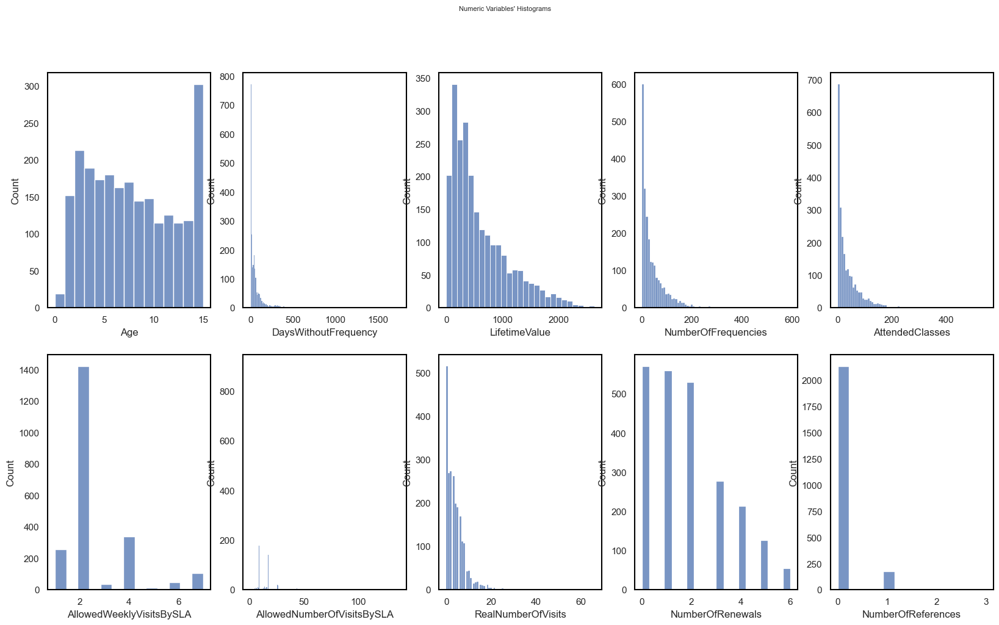

In [85]:
# All Numeric Variables' Histograms in one figure
sns.set()

# Prepare figure. Create individual axes where each histogram will be placed
fig, axes = plt.subplots(2, ceil(len(metric_features) / 2), figsize=(20, 11))

for ax_row in axes:
    for ax in ax_row:
        ax.set_facecolor('white') # White background
        for spine in ax.spines.values():
            spine.set_edgecolor('black')  # Frame color
            spine.set_linewidth(1.5) 
            
# Plot data
# Iterate across axes objects and associate each histogram
for ax, feat in zip(axes.flatten(), metric_features):
    sns.histplot(x=df[feat], ax=ax)
    
# Layout
title = "Numeric Variables' Histograms"
plt.suptitle(title)
plt.show()

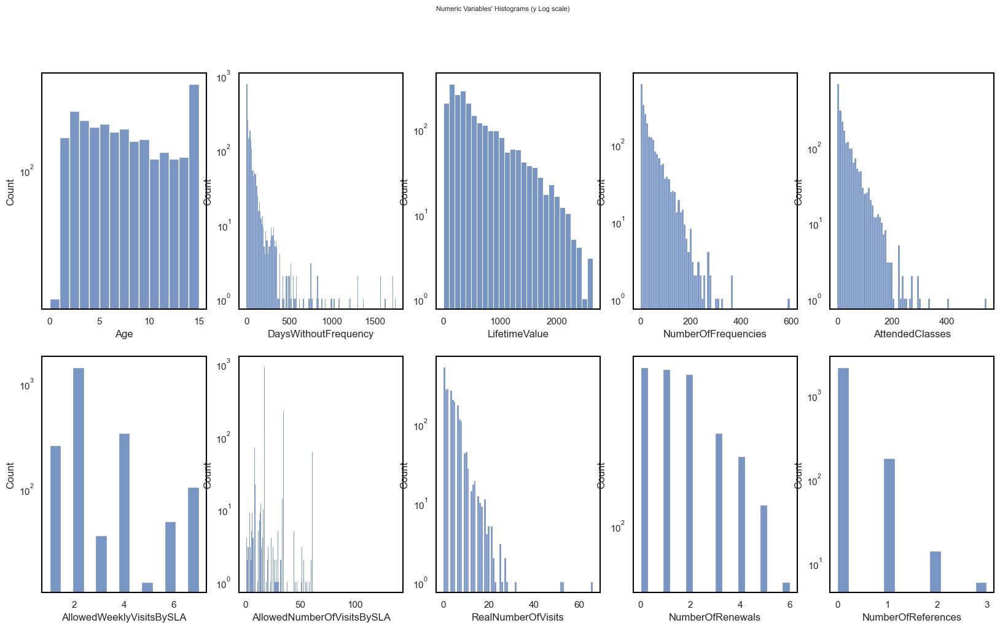

In [86]:
# All Numeric Variables' Histograms in one figure with log scale
sns.set()

# Prepare figure. Create individual axes where each histogram will be placed
fig, axes = plt.subplots(2, ceil(len(metric_features) / 2), figsize=(20, 11))

for ax_row in axes:
    for ax in ax_row:
        ax.set_facecolor('white') # White background
        for spine in ax.spines.values():
            spine.set_edgecolor('black')  # Frame color
            spine.set_linewidth(1.5) 
            
# Plot data
# Iterate across axes objects and associate each histogram
for ax, feat in zip(axes.flatten(), metric_features):
    sns.histplot(x=df[feat], ax=ax)
    ax.set_yscale("log")  # Set a logarithmic scale for the y-axis
    
# Layout
title = "Numeric Variables' Histograms (y Log scale)"
plt.suptitle(title)
plt.show()

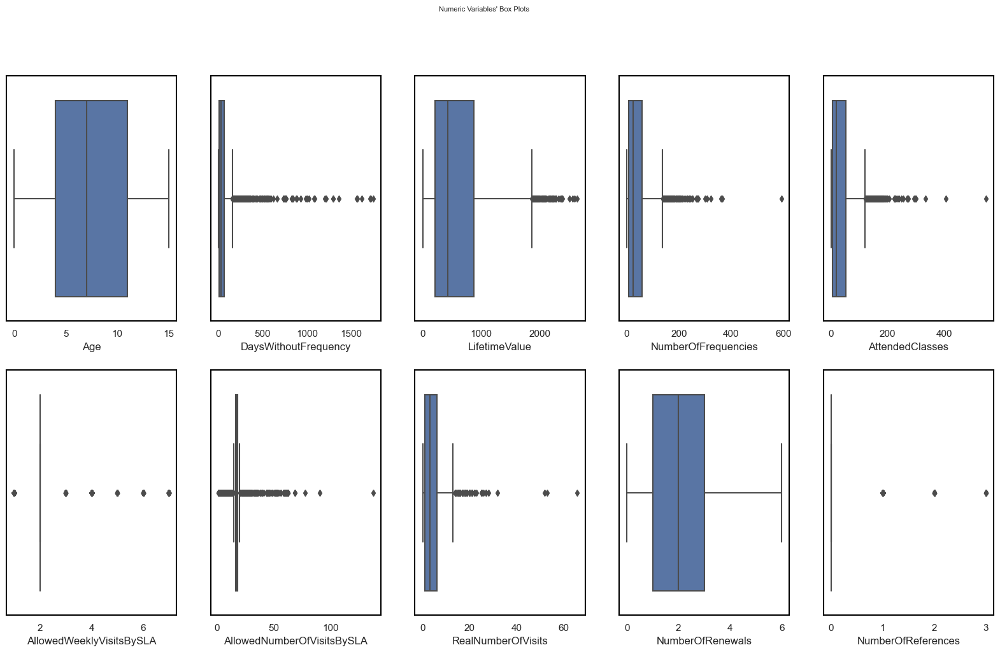

In [87]:
# Boxplots to visualise outliers
sns.set()
fig, axes = plt.subplots(2, ceil(len(metric_features) / 2), figsize=(20, 11))

for ax_row in axes:
    for ax in ax_row:
        ax.set_facecolor('white') # White background
        for spine in ax.spines.values():
            spine.set_edgecolor('black')  # Frame color
            spine.set_linewidth(1.5) 

for ax, feat in zip(axes.flatten(), metric_features):
    sns.boxplot(x=df[feat], ax=ax)
    
title = "Numeric Variables' Box Plots"
plt.suptitle(title)
plt.show()

<div class="alert alert-block alert-success">
    
## Transformations

</div>

As we can see from the histograms, some features can benefit from a logarithmic transformation, due to their distribution being right-skewed.

In [88]:
features_transform = ['DaysWithoutFrequency', 'LifetimeValue', 'NumberOfFrequencies', 'AttendedClasses', 
                      'AllowedNumberOfVisitsBySLA', 'RealNumberOfVisits', 'NumberOfRenewals', 'NumberOfReferences']

pt = PowerTransformer()
df[features_transform] = pd.DataFrame(pt.fit_transform(df[features_transform]), index=df[features_transform].index, columns=df[features_transform].columns)

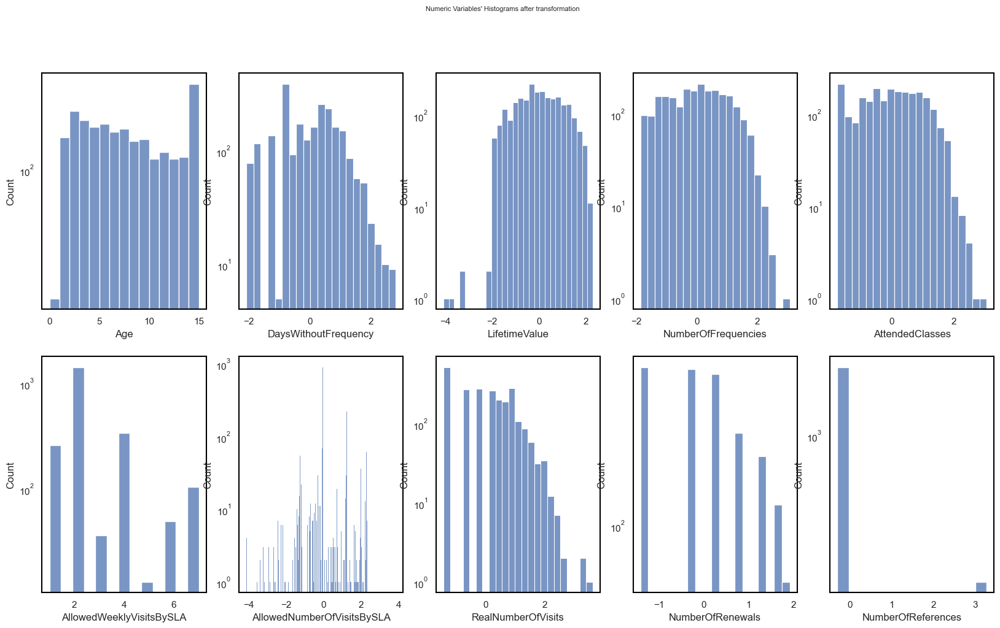

In [89]:
# Check distributions after transformation
sns.set()

# Prepare figure. Create individual axes where each histogram will be placed
fig, axes = plt.subplots(2, ceil(len(metric_features) / 2), figsize=(20, 11))

for ax_row in axes:
    for ax in ax_row:
        ax.set_facecolor('white') # White background
        for spine in ax.spines.values():
            spine.set_edgecolor('black')  # Frame color
            spine.set_linewidth(1.5) 
            
# Plot data
# Iterate across axes objects and associate each histogram
for ax, feat in zip(axes.flatten(), metric_features):
    sns.histplot(x=df[feat], ax=ax)
    ax.set_yscale("log")  # Set a logarithmic scale for the y-axis
    
# Layout
title = "Numeric Variables' Histograms after transformation"
plt.suptitle(title)
plt.show()

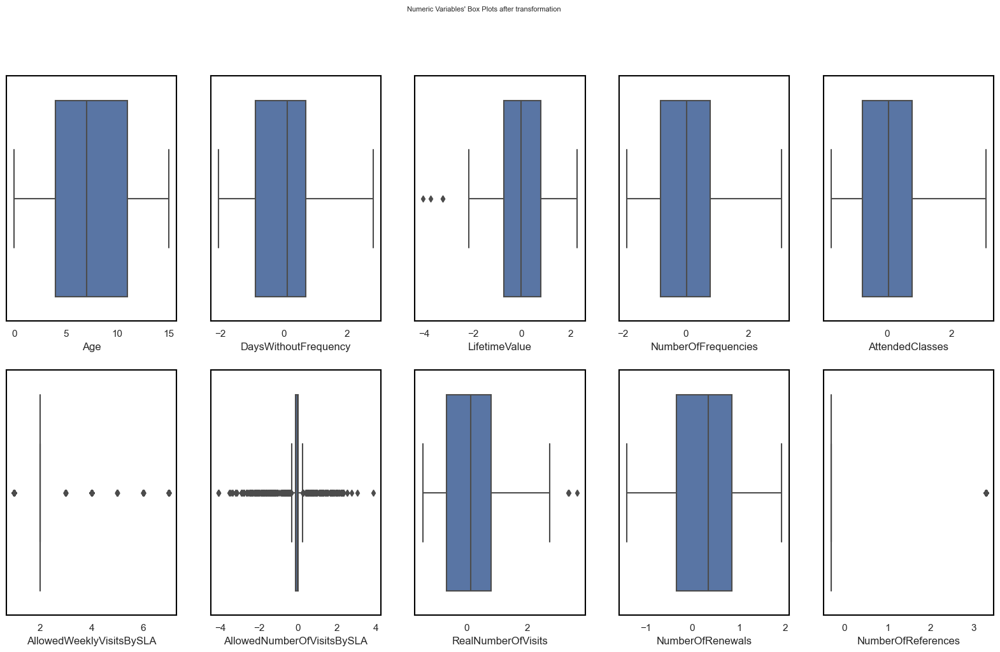

In [90]:
# Boxplots after transformations
sns.set()
fig, axes = plt.subplots(2, ceil(len(metric_features) / 2), figsize=(20, 11))

for ax_row in axes:
    for ax in ax_row:
        ax.set_facecolor('white') # White background
        for spine in ax.spines.values():
            spine.set_edgecolor('black')  # Frame color
            spine.set_linewidth(1.5) 

for ax, feat in zip(axes.flatten(), metric_features):
    sns.boxplot(x=df[feat], ax=ax)
    
title = "Numeric Variables' Box Plots after transformation"
plt.suptitle(title)
plt.show()

Let's try several methods for outlier removal: IQR, Z-score and manual.

### IQR

In [91]:
df_iqr = df[metric_features].copy()

Q1 = df_iqr.quantile(0.25)
Q3 = df_iqr.quantile(0.75)
IQR = Q3 - Q1
df_iqr = df_iqr[~((df_iqr < (Q1 - 1.5 * IQR)) |(df_iqr > (Q3 + 1.5 * IQR))).any(axis=1)]
print('Percentage of data kept after removing outliers:', np.round(df_iqr.shape[0] / df_original.shape[0], 4))


Percentage of data kept after removing outliers: 0.5004


### Z-Score

In [92]:
df_z = df[metric_features].copy()
z = np.abs(stats.zscore(df_z))
threshold = 4.5
df_z = df_z[(z < threshold).all(axis=1)]
print('Percentage of data kept after removing outliers:', np.round(df_z.shape[0] / df_original.shape[0], 4))

Percentage of data kept after removing outliers: 0.0


### Visual Inspection

In [93]:
df_v = df.copy()
filters = (
    (df_v['LifetimeValue']>-3)
    & (df_v['LifetimeValue']) 
    & (df_v['AllowedNumberOfVisitsBySLA']>-3.5)
    & (df_v['AllowedNumberOfVisitsBySLA']<3.5)
    & (df_v['RealNumberOfVisits']<3.5)
)

df_v = df[filters]

print('Percentage of data kept after removing outliers:', np.round(df_v.shape[0] / df_original.shape[0], 4))

Percentage of data kept after removing outliers: 0.9953


We'll keep visual inspection. After missing values and feature engineering, we'll check again for outliers. 

In [94]:
df = df_v

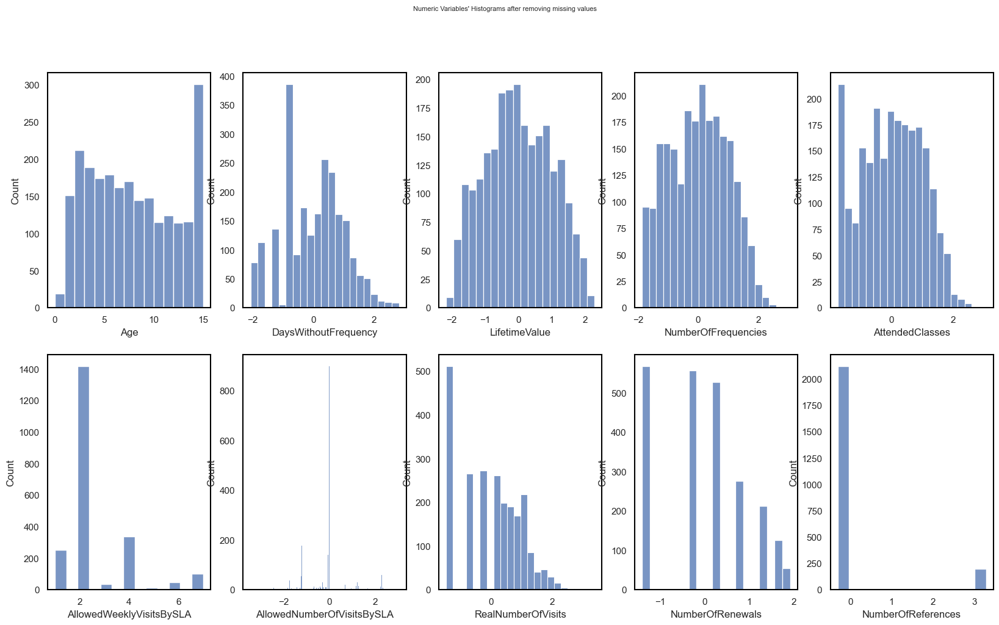

In [95]:
# Check distributions after transformation
sns.set()

# Prepare figure. Create individual axes where each histogram will be placed
fig, axes = plt.subplots(2, ceil(len(metric_features) / 2), figsize=(20, 11))

for ax_row in axes:
    for ax in ax_row:
        ax.set_facecolor('white') # White background
        for spine in ax.spines.values():
            spine.set_edgecolor('black')  # Frame color
            spine.set_linewidth(1.5) 
            
# Plot data
# Iterate across axes objects and associate each histogram
for ax, feat in zip(axes.flatten(), metric_features):
    sns.histplot(x=df[feat], ax=ax)
    
    
# Layout
title = "Numeric Variables' Histograms after removing missing values"
plt.suptitle(title)
plt.show()

<div class="alert alert-block alert-success">

## Non metric features
</div>

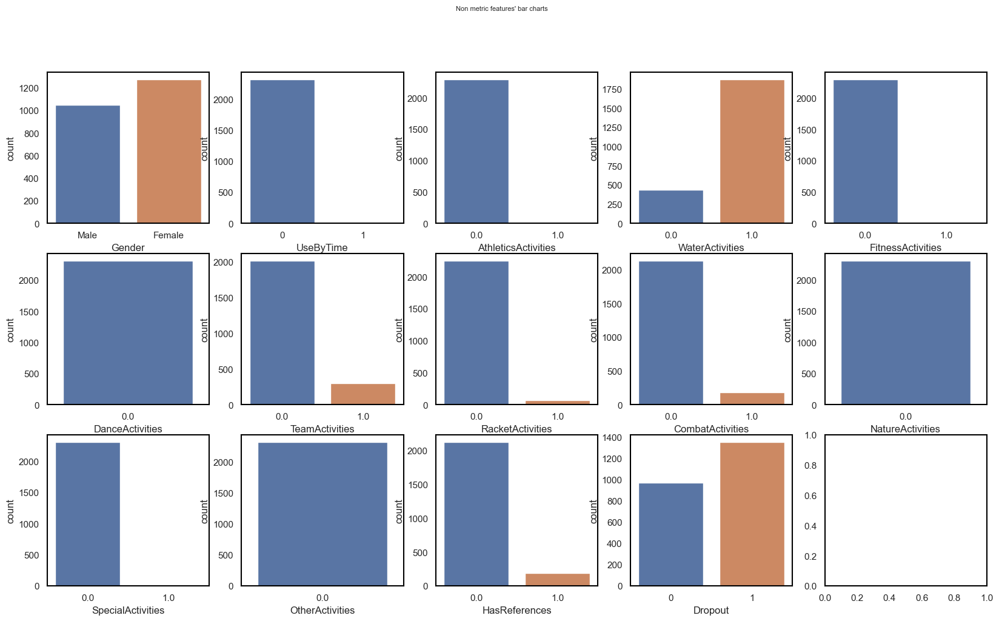

In [96]:
# All non-metric Variables' Box Plots in one figure
sns.set()

# Prepare figure. Create individual axes where each box plot will be placed
fig, axes = plt.subplots(3, ceil(len(non_metric_features) / 3), figsize=(20, 11))

# Aesthetic
for ax_row in axes:
    for ax in ax_row:
        ax.set_facecolor('white') # White background
        for spine in ax.spines.values():
            spine.set_edgecolor('black')  # Frame color
            spine.set_linewidth(1.5)

# Plot data
for ax, feat in zip(axes.flatten(), non_metric_features): 
    sns.countplot(x=df[feat], ax=ax)
    
# Layout
# Add a centered title to the figure:
title = "Non metric features' bar charts"

plt.suptitle(title)

plt.show()

<div class="alert alert-block alert-success">

## 2.2. Missing values


In [97]:
# Avoid having empty strings 
df.replace('', np.nan, inplace=True)

In [98]:
# Count missing values
df.isna().sum()

Age                             0
Gender                          0
EnrollmentStart                 0
EnrollmentFinish                0
LastPeriodStart                 0
LastPeriodFinish                0
DateLastVisit                   0
DaysWithoutFrequency            0
LifetimeValue                   0
UseByTime                       0
AthleticsActivities             4
WaterActivities                 8
FitnessActivities               4
DanceActivities                 7
TeamActivities                  9
RacketActivities                5
CombatActivities                4
NatureActivities               11
SpecialActivities               5
OtherActivities                 4
NumberOfFrequencies             2
AttendedClasses                 0
AllowedWeeklyVisitsBySLA      109
AllowedNumberOfVisitsBySLA      0
RealNumberOfVisits              0
NumberOfRenewals                0
HasReferences                   8
NumberOfReferences              0
Dropout                         0
dtype: int64

<Axes: >

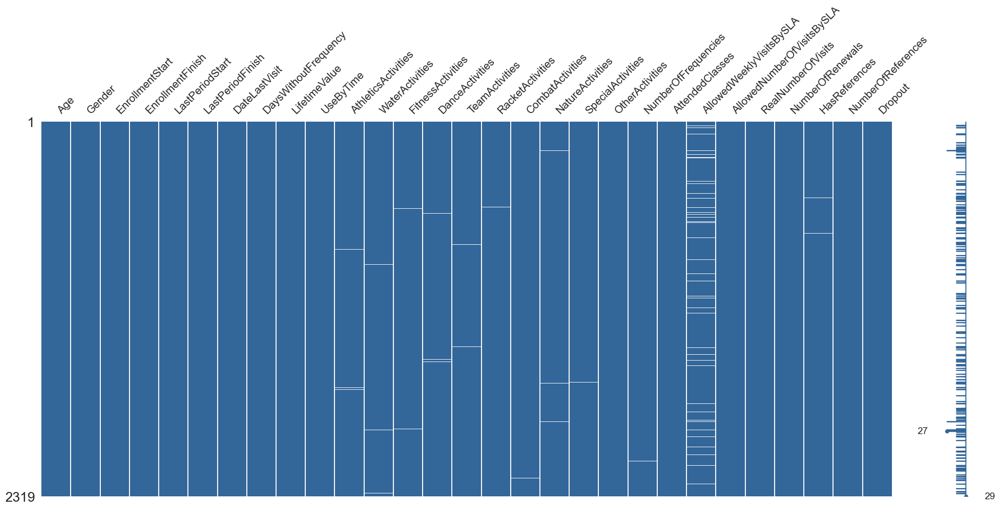

In [99]:
msno.matrix(df, color=(0.2, 0.4, 0.6))

**Missing values on Activities** <br>
It doesn's make sense that a client isn't enrolled on at least 1 activity.<br>
Therefore, if there's a missing value but the person isn't enrolled on any other activity, then that missing value will be 1.

In [100]:
activities = ['AthleticsActivities','WaterActivities', 'FitnessActivities', 'RacketActivities', 'CombatActivities','SpecialActivities', 
              'TeamActivities', 'DanceActivities', 'NatureActivities', 'OtherActivities']

In [101]:
# Check in there's anyone that isn't in any activity

df[df[activities].eq(0).all(axis=1)]
# Verifica se cada elemento nas colunas especificadas é igual a 0 - > .eq(0) ,
# all(axis=1) verifica se todas as condições são verdadeiras

,Age,Gender,EnrollmentStart,EnrollmentFinish,LastPeriodStart,LastPeriodFinish,DateLastVisit,DaysWithoutFrequency,LifetimeValue,UseByTime,...,OtherActivities,NumberOfFrequencies,AttendedClasses,AllowedWeeklyVisitsBySLA,AllowedNumberOfVisitsBySLA,RealNumberOfVisits,NumberOfRenewals,HasReferences,NumberOfReferences,Dropout
ID,,,,,,,,,,,,,,,,,,,,,


In [102]:
for act in activities:
    # df[activities].drop(act, axis=1).eq(0).all(axis=1) 
    #-> retirando a act, verificar as restantes featues são 0
    condition = (df[act].isna()) & (df[activities].drop(act, axis=1).eq(0).all(axis=1))

    # substituir por 1    
    df.loc[condition, act] = 1

In [103]:
df.isna().sum()

Age                             0
Gender                          0
EnrollmentStart                 0
EnrollmentFinish                0
LastPeriodStart                 0
LastPeriodFinish                0
DateLastVisit                   0
DaysWithoutFrequency            0
LifetimeValue                   0
UseByTime                       0
AthleticsActivities             4
WaterActivities                 0
FitnessActivities               4
DanceActivities                 7
TeamActivities                  8
RacketActivities                5
CombatActivities                4
NatureActivities               11
SpecialActivities               4
OtherActivities                 4
NumberOfFrequencies             2
AttendedClasses                 0
AllowedWeeklyVisitsBySLA      109
AllowedNumberOfVisitsBySLA      0
RealNumberOfVisits              0
NumberOfRenewals                0
HasReferences                   8
NumberOfReferences              0
Dropout                         0
dtype: int64

On categorical features and 'NumberOfFrequencies' since they don't have many missing values, we'll impute them with the mode

In [104]:
binary_features_to_fill = activities + ["HasReferences"]

df.fillna(df[binary_features_to_fill].mode().iloc[0],inplace=True)

For 'AllowedWeeklyVisitsBySLA' and 'Income' (5% missing values) we'll use the median.

In [105]:
scaler = RobustScaler()
scaled_feat = scaler.fit_transform(df[metric_features])

imputer = KNNImputer(n_neighbors=5, weights="uniform")
imputed_feat = imputer.fit_transform(scaled_feat)
df[metric_features] = scaler.inverse_transform(imputed_feat)

In [106]:
df.isna().sum()

Age                           0
Gender                        0
EnrollmentStart               0
EnrollmentFinish              0
LastPeriodStart               0
LastPeriodFinish              0
DateLastVisit                 0
DaysWithoutFrequency          0
LifetimeValue                 0
UseByTime                     0
AthleticsActivities           0
WaterActivities               0
FitnessActivities             0
DanceActivities               0
TeamActivities                0
RacketActivities              0
CombatActivities              0
NatureActivities              0
SpecialActivities             0
OtherActivities               0
NumberOfFrequencies           0
AttendedClasses               0
AllowedWeeklyVisitsBySLA      0
AllowedNumberOfVisitsBySLA    0
RealNumberOfVisits            0
NumberOfRenewals              0
HasReferences                 0
NumberOfReferences            0
Dropout                       0
dtype: int64

We do this to create new features without any problems

In [107]:
df[features_transform] = pt.inverse_transform(df[features_transform])

In [108]:
df["NumberOfRenewals"] = df["NumberOfRenewals"].astype(int)

<div class="alert alert-block alert-info">


## Feature Engineering

</div>

In [109]:

df.head()

,Age,Gender,EnrollmentStart,EnrollmentFinish,LastPeriodStart,LastPeriodFinish,DateLastVisit,DaysWithoutFrequency,LifetimeValue,UseByTime,...,OtherActivities,NumberOfFrequencies,AttendedClasses,AllowedWeeklyVisitsBySLA,AllowedNumberOfVisitsBySLA,RealNumberOfVisits,NumberOfRenewals,HasReferences,NumberOfReferences,Dropout
ID,,,,,,,,,,,,,,,,,,,,,
10003,9.0,Male,2018-09-05,2019-02-12,2018-07-01,2019-06-30,2019-01-21,22.0,155.40,0,...,0.0,20.0,2.0,2.0,17.72,3.0,0,0.0,0.0,1
10009,14.0,Female,2016-07-07,2017-02-01,2016-07-01,2017-06-30,2016-11-19,74.0,253.50,0,...,0.0,6.0,6.0,2.0,17.72,0.0,1,0.0,0.0,1
10013,12.0,Female,2017-10-02,2018-07-31,2018-01-01,2018-12-31,2017-11-11,262.0,188.60,0,...,0.0,1.0,0.0,2.0,17.42,0.0,0,0.0,0.0,1
10025,13.0,Female,2015-09-09,2019-10-31,2019-07-01,2019-12-31,2019-10-26,5.0,596.30,0,...,0.0,27.0,18.0,2.0,6.28,3.0,3,0.0,0.0,0
10031,2.0,Male,2015-09-19,2016-11-07,2016-07-01,2016-12-31,2016-07-23,107.0,492.85,0,...,0.0,17.0,17.0,2.0,15.14,0.0,1,0.0,0.0,1


In [110]:
# Create Recency -> number of days since last visit
df["Recency"] = (pd.to_datetime("2019-10-31") - df["DateLastVisit"]).dt.days

# EnrollmentTime -> days spent enrolled
df["EnrollmentTime"] = (df["EnrollmentFinish"] - df["EnrollmentStart"]).dt.days

# AverageSpent -> average spent per visit in $
df["AverageSpent"] = df["LifetimeValue"] / df["NumberOfFrequencies"]

# HasRenewals -> if a person Renewal or not
df['HasRenewals'] = (df['NumberOfRenewals'] > 0).astype(int)

# ServiceVisitsRatio -> Ratio between the allowed and the real number of visits in the service time
df["ServiceVisitsRatio"] = df["RealNumberOfVisits"] / df["AllowedNumberOfVisitsBySLA"] 

# AttendedClassesPerVisit -> 
df["AttendedClassesPerVisit"] = df["AttendedClasses"] / df["NumberOfFrequencies"]

# EnrollmentTimeByRenewal -> Enrollment time between each Renewal
df["EnrollmentTimeByRenewal"] = df["EnrollmentTime"] / df["NumberOfRenewals"].replace(0, 1) # Replace 0 by 1 avoid null values

In [111]:
df.head()

,Age,Gender,EnrollmentStart,EnrollmentFinish,LastPeriodStart,LastPeriodFinish,DateLastVisit,DaysWithoutFrequency,LifetimeValue,UseByTime,...,HasReferences,NumberOfReferences,Dropout,Recency,EnrollmentTime,AverageSpent,HasRenewals,ServiceVisitsRatio,AttendedClassesPerVisit,EnrollmentTimeByRenewal
ID,,,,,,,,,,,,,,,,,,,,,
10003,9.0,Male,2018-09-05,2019-02-12,2018-07-01,2019-06-30,2019-01-21,22.0,155.40,0,...,0.0,0.0,1,283,160,7.770000,0,0.169300,0.100000,160.000000
10009,14.0,Female,2016-07-07,2017-02-01,2016-07-01,2017-06-30,2016-11-19,74.0,253.50,0,...,0.0,0.0,1,1076,209,42.250000,1,0.000000,1.000000,209.000000
10013,12.0,Female,2017-10-02,2018-07-31,2018-01-01,2018-12-31,2017-11-11,262.0,188.60,0,...,0.0,0.0,1,719,302,188.600000,0,0.000000,0.000000,302.000000
10025,13.0,Female,2015-09-09,2019-10-31,2019-07-01,2019-12-31,2019-10-26,5.0,596.30,0,...,0.0,0.0,0,5,1513,22.085185,1,0.477707,0.666667,504.333333
10031,2.0,Male,2015-09-19,2016-11-07,2016-07-01,2016-12-31,2016-07-23,107.0,492.85,0,...,0.0,0.0,1,1195,415,28.991176,1,0.000000,1.000000,415.000000


In [112]:
# Update metric_features
new_feats = ["Recency", "EnrollmentTime", "AverageSpent", "ServiceVisitsRatio", "AttendedClassesPerVisit", "EnrollmentTimeByRenewal"]
metric_features += new_feats

# Update non-metric features
non_metric_features.append('HasRenewals')

<div class="alert alert-block alert-info">


# Re-do data exploration


## Dimensionality Reduction

Date type variables won't be very useful for clustering. Since we extracted all the information we needed from them, they will be dropped.

In [113]:
# Drop date type varibles
df = df.drop(columns=['EnrollmentStart', 'EnrollmentFinish', 'LastPeriodStart', 'LastPeriodFinish', 'DateLastVisit'])

<div class="alert alert-block alert-success">

## Metric features

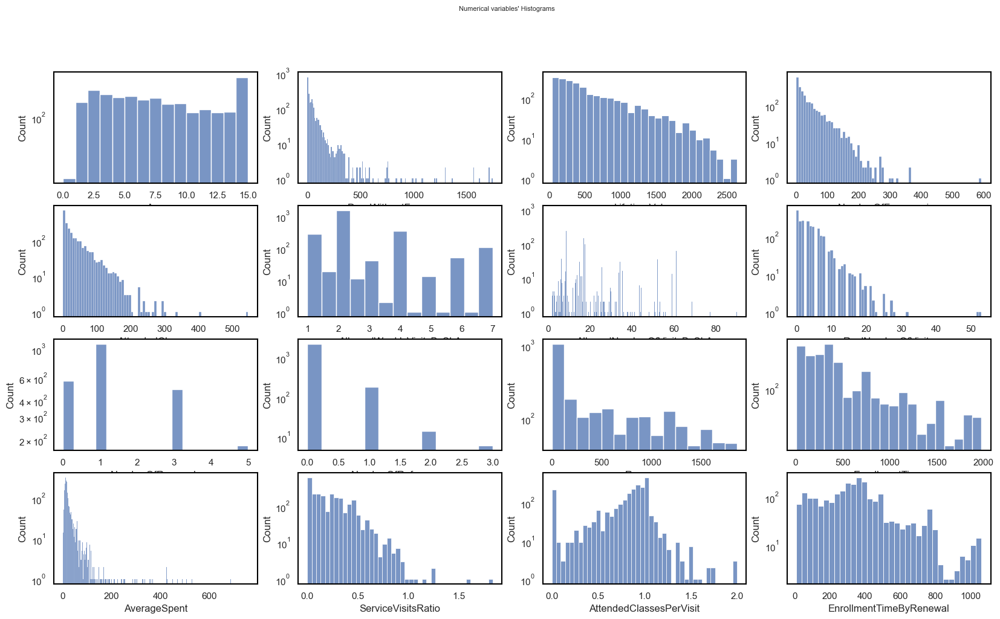

In [114]:
# Check distributions of new features
sns.set()

# Prepare figure. Create individual axes where each histogram will be placed
fig, axes = plt.subplots(4, ceil(len(metric_features) / 4), figsize=(20, 11))

for ax_row in axes:
    for ax in ax_row:
        ax.set_facecolor('white') # White background
        for spine in ax.spines.values():
            spine.set_edgecolor('black')  # Frame color
            spine.set_linewidth(1.5) 
            
# Plot data
# Iterate across axes objects and associate each histogram
for ax, feat in zip(axes.flatten(), metric_features):
    sns.histplot(x=df[feat], ax=ax)
    ax.set_yscale("log")  # Set a logarithmic scale for the y-axis
    
# Layout
title = "Numerical variables' Histograms"
plt.suptitle(title)
plt.show()

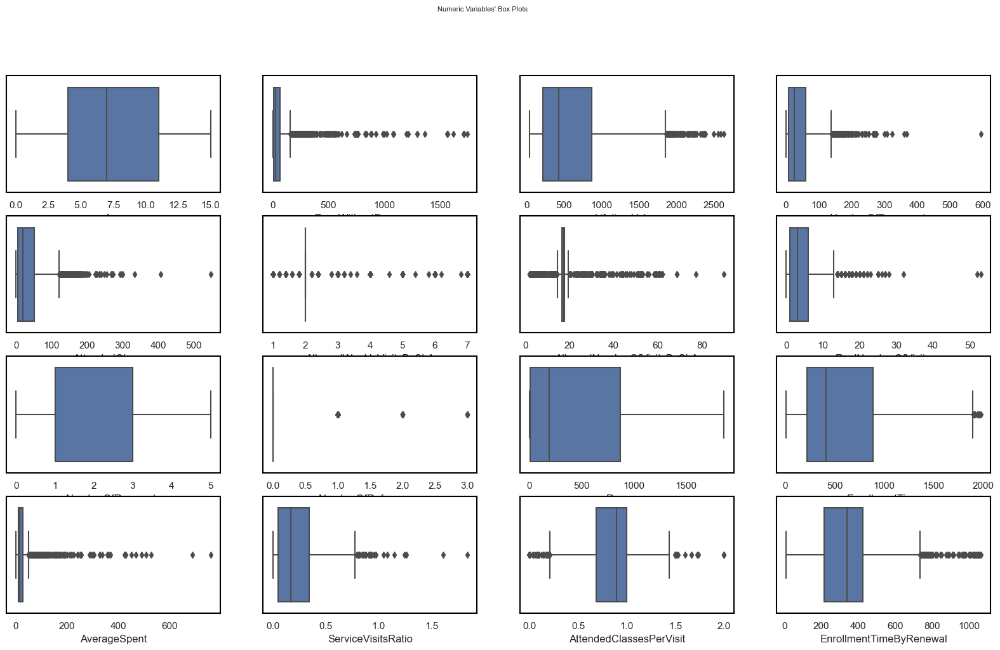

In [115]:
# Boxplots 
sns.set()
fig, axes = plt.subplots(4, ceil(len(metric_features) / 4), figsize=(20, 11))

for ax_row in axes:
    for ax in ax_row:
        ax.set_facecolor('white') # White background
        for spine in ax.spines.values():
            spine.set_edgecolor('black')  # Frame color
            spine.set_linewidth(1.5) 

for ax, feat in zip(axes.flatten(), metric_features):
    sns.boxplot(x=df[feat], ax=ax)
    
title = "Numeric Variables' Box Plots"
plt.suptitle(title)
plt.show()

<div class="alert alert-block alert-success">

### Transformations

</div>

Some of the new features need to suffer a transformation due to their positive skewness.

In [116]:
features_transform += ['EnrollmentTime', 'AverageSpent', 'ServiceVisitsRatio', 'AttendedClassesPerVisit', 'EnrollmentTimeByRenewal']

pt2 = PowerTransformer()

df[features_transform] = pd.DataFrame(pt2.fit_transform(df[features_transform]), index=df[features_transform].index, columns=df[features_transform].columns)

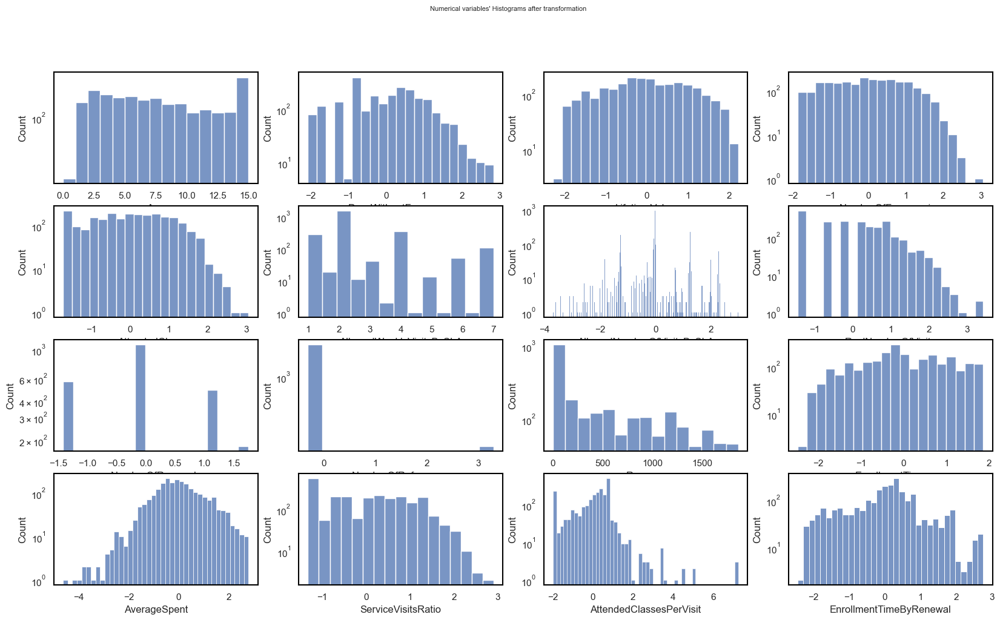

In [117]:
sns.set()

# Prepare figure. Create individual axes where each histogram will be placed
fig, axes = plt.subplots(4, ceil(len(metric_features) / 4), figsize=(20, 11))

for ax_row in axes:
    for ax in ax_row:
        ax.set_facecolor('white') # White background
        for spine in ax.spines.values():
            spine.set_edgecolor('black')  # Frame color
            spine.set_linewidth(1.5) 
            
# Plot data
# Iterate across axes objects and associate each histogram
for ax, feat in zip(axes.flatten(), metric_features):
    sns.histplot(x=df[feat], ax=ax)
    ax.set_yscale("log")  # Set a logarithmic scale for the y-axis
    
# Layout
title = "Numerical variables' Histograms after transformation"
plt.suptitle(title)
plt.show()

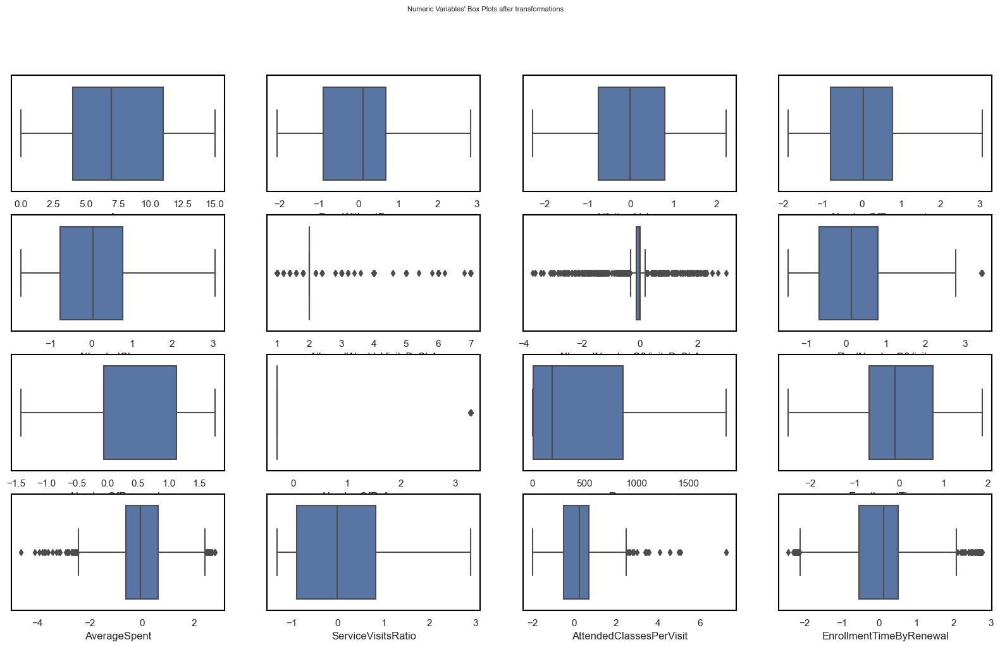

In [118]:
# Boxplots 
sns.set()
fig, axes = plt.subplots(4, ceil(len(metric_features) / 4), figsize=(20, 11))

for ax_row in axes:
    for ax in ax_row:
        ax.set_facecolor('white') # White background
        for spine in ax.spines.values():
            spine.set_edgecolor('black')  # Frame color
            spine.set_linewidth(1.5) 

for ax, feat in zip(axes.flatten(), metric_features):
    sns.boxplot(x=df[feat], ax=ax)
    
title = "Numeric Variables' Box Plots after transformations"
plt.suptitle(title)
plt.show()

<div class="alert alert-block alert-success">
    
### Outliers (traditional methods)

In [119]:
# IQR
df_iqr = df[metric_features].copy()
Q1 = df_iqr.quantile(0.25)
Q3 = df_iqr.quantile(0.75)
IQR = Q3 - Q1
df_iqr = df_iqr[~((df_iqr < (Q1 - 1.5 * IQR)) |(df_iqr > (Q3 + 1.5 * IQR))).any(axis=1)]
print('Percentage of data kept after removing outliers:', np.round(df_iqr.shape[0] / df_original.shape[0], 4))

# Z-score
df_z = df.copy()
z = np.abs(stats.zscore(df_z[metric_features]))
threshold = 4
df_z = df_z[(z < threshold).all(axis=1)]
print('Percentage of data kept after removing outliers:', np.round(df_z.shape[0] / df_original.shape[0], 4))

# Visual inspection
df_v = df.copy()
filters = (
    (df_v['AttendedClassesPerVisit']<5) 
    & (df_v['AllowedNumberOfVisitsBySLA']>-3)
    & (df_v['AverageSpent']>-4))
df_v = df[filters]
print('Percentage of data kept after removing outliers:', np.round(df_v.shape[0] / df_original.shape[0], 4))

Percentage of data kept after removing outliers: 0.479
Percentage of data kept after removing outliers: 0.991
Percentage of data kept after removing outliers: 0.988


In [120]:
# Make a copy before 2nd take of outliers
df_before_2outlier = df.copy()

# We'll use visual inspection
df = df_v

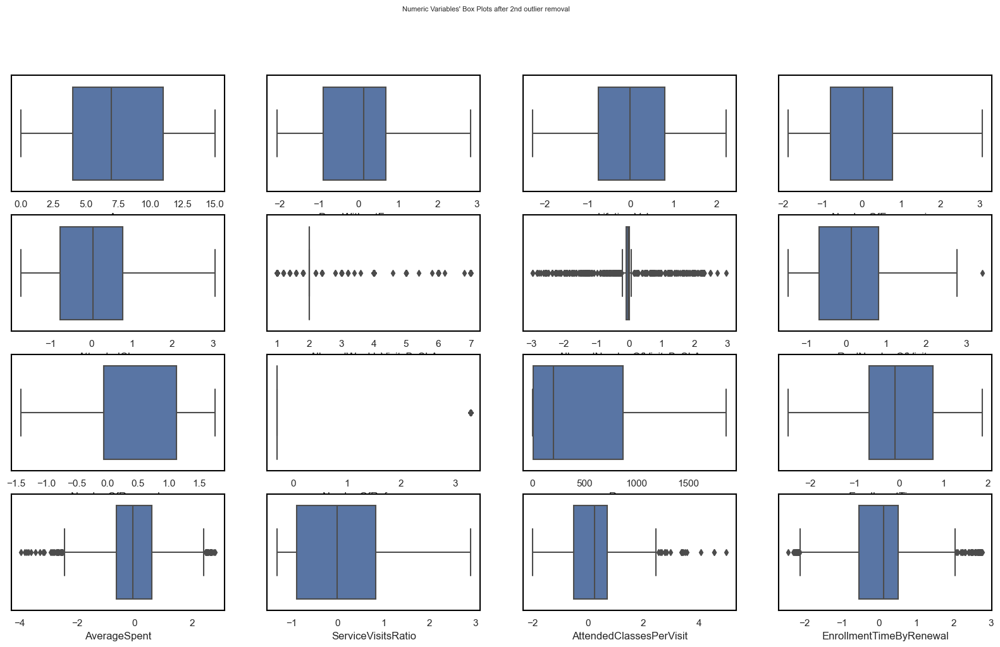

In [121]:
# Boxplots after 2nd outlier
sns.set()
fig, axes = plt.subplots(4, ceil(len(metric_features) / 4), figsize=(20, 11))

for ax_row in axes:
    for ax in ax_row:
        ax.set_facecolor('white') # White background
        for spine in ax.spines.values():
            spine.set_edgecolor('black')  # Frame color
            spine.set_linewidth(1.5) 

for ax, feat in zip(axes.flatten(), metric_features):
    sns.boxplot(x=df[feat], ax=ax)
    
title = "Numeric Variables' Box Plots after 2nd outlier removal"
plt.suptitle(title)
plt.show()

<div class="alert alert-block alert-success">

## Non metric features

In [122]:
df_encoded = pd.get_dummies(df, columns=["Gender"], drop_first=True)
df_encoded.rename(columns={'Gender_Male': 'Male'}, inplace=True)
df = df_encoded

# update non_metric features
non_metric_features.remove('Gender')
non_metric_features.append('Male')

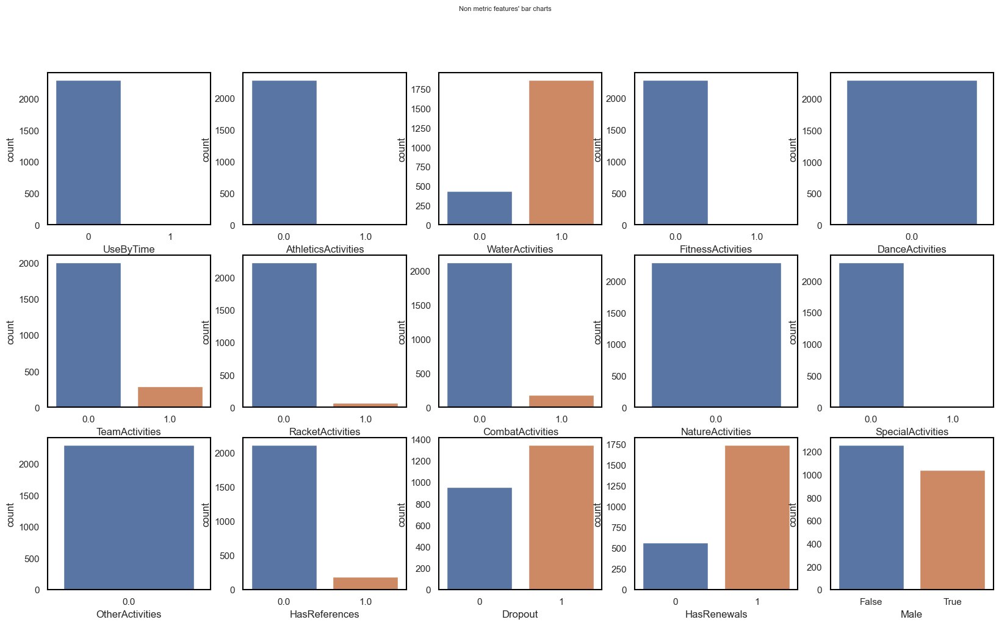

In [123]:
# All non-metric Variables' Box Plots in one figure
sns.set()

# Prepare figure. Create individual axes where each box plot will be placed
fig, axes = plt.subplots(3, ceil(len(non_metric_features) / 3), figsize=(20, 11))

# Aesthetic
for ax_row in axes:
    for ax in ax_row:
        ax.set_facecolor('white') # White background
        for spine in ax.spines.values():
            spine.set_edgecolor('black')  # Frame color
            spine.set_linewidth(1.5)

# Plot data
for ax, feat in zip(axes.flatten(), non_metric_features): 
    sns.countplot(x=df[feat], ax=ax)
    
# Layout
# Add a centered title to the figure:
title = "Non metric features' bar charts"

plt.suptitle(title)

plt.show()

<div class="alert alert-block alert-info">

## 5. Feature selection


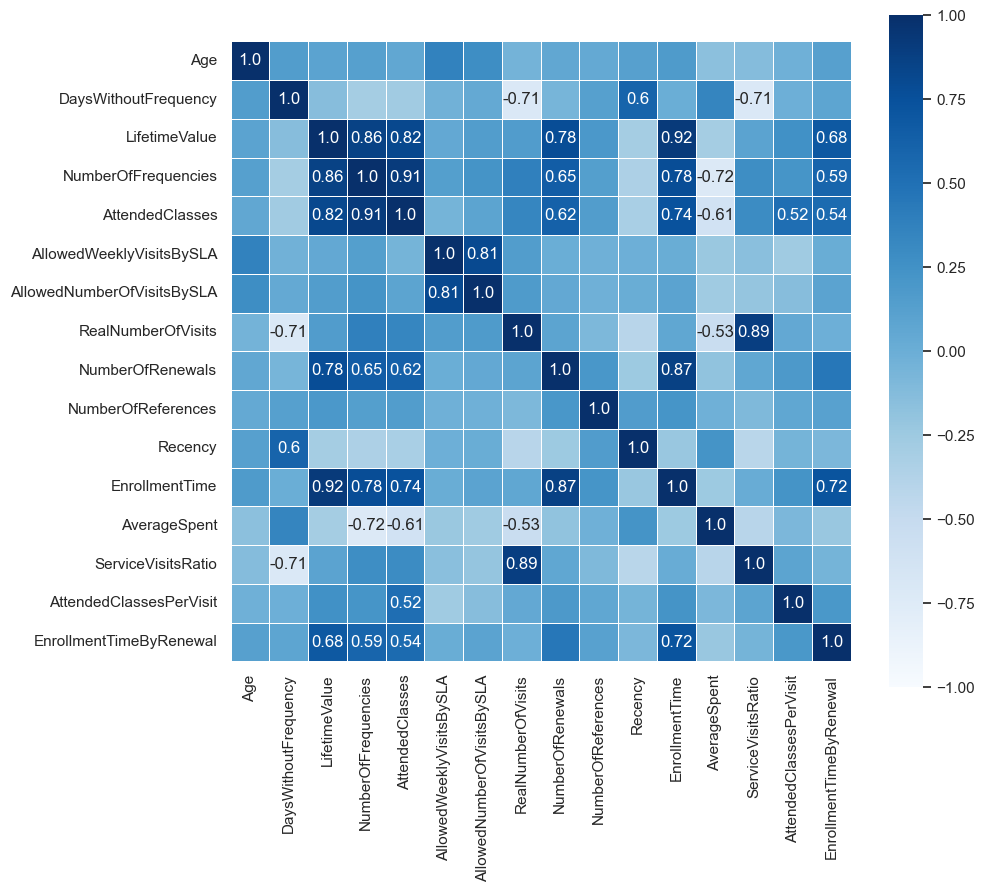

In [124]:
# Correlation Matrix
fig = plt.figure(figsize=(10, 8))

# Obtain correlation matrix. Round the values to 2 decimal cases. Use the DataFrame corr() and round() method.
corr = df[metric_features].corr().round(2)

# Build annotation matrix (values above |0.5| will appear annotated in the plot)
mask_annot = np.absolute(corr.values) >= 0.5
annot = np.where(mask_annot, corr.values, np.full(corr.shape,""))

# Plot heatmap of the correlation matrix
crest_palette = sns.color_palette("Blues", as_cmap=True)
# Plot the heatmap
sns.heatmap(data=corr, annot=annot, 
            cmap=crest_palette,  # Use the "crest" color palette
            fmt='s', vmin=-1, vmax=1, center=0, square=True, linewidths=.5)

# Layout
fig.subplots_adjust(top=0.95)

plt.show()

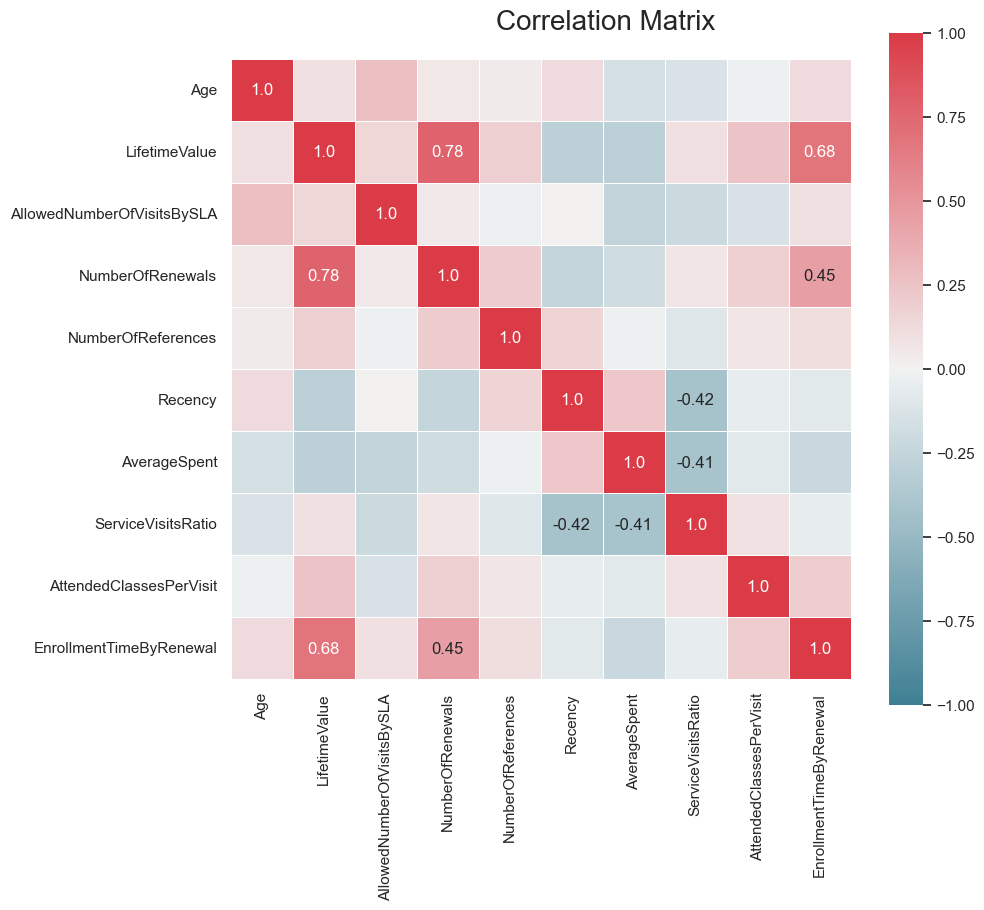

In [125]:
feats_corr = ['Age',"LifetimeValue","AllowedNumberOfVisitsBySLA","NumberOfRenewals",'NumberOfReferences', 'Recency','AverageSpent',
              "ServiceVisitsRatio", 'AttendedClassesPerVisit',"EnrollmentTimeByRenewal"]

# Features took out  "NumberOfRenewals",
# DaysWithoutFrequency - vety correlated with Recency and ServiceVisitsRatio, which we mantain both
# NumberofFrequencies and Attended Classes - both pretty similar with LifetimeValue and correlated to AttendedClassesPerVisit, with those both being maintained
# AllowedWeeklyOfVisitsBySLA - we would take out either this or AllowedNumberOfVisitsBySLA, and since Weekly has more missing values, we took out
# RealNumberOfVisits - very similar and correlated to ServiceVisitsRatio, which we decide to mantain
# EnrollmentTime - very correlated and similar to features we kept(LifeTimeValue,EnrollmentTimeByRenewal)


# Correlation Matrix
fig = plt.figure(figsize=(10, 8))

# Obtain correlation matrix. Round the values to 2 decimal cases. Use the DataFrame corr() and round() method.
corr = df[feats_corr].corr().round(2)

# Build annotation matrix (values above |0.5| will appear annotated in the plot)
mask_annot = np.absolute(corr.values) >= 0.4
annot = np.where(mask_annot, corr.values, np.full(corr.shape,""))

# Plot heatmap of the correlation matrix
sns.heatmap(data=corr, annot=annot, 
            cmap=sns.diverging_palette(220, 10, as_cmap=True), 
            fmt='s', vmin=-1, vmax=1, center=0, square=True, linewidths=.5)

# Layout
fig.subplots_adjust(top=0.95)
fig.suptitle("Correlation Matrix", fontsize=20)

plt.show()

In [126]:
# Create a copy before clustering
df_bef_cluster = df.copy()

# Normalize data
scaler = RobustScaler()
scaled_data = scaler.fit_transform(df[feats_corr])
df_robust = pd.DataFrame(scaled_data, index=df[feats_corr].index, columns=df[feats_corr].columns)

 Training...
 random_initialization took: 0.000000 seconds
 Rough training...
 radius_ini: 17.000000 , radius_final: 2.833333, trainlen: 100

 epoch: 1 ---> elapsed time:  0.165000, quantization error: 2.176691

 epoch: 2 ---> elapsed time:  0.210000, quantization error: 3.032577

 epoch: 3 ---> elapsed time:  0.180000, quantization error: 3.005995

 epoch: 4 ---> elapsed time:  0.190000, quantization error: 2.989555

 epoch: 5 ---> elapsed time:  0.185000, quantization error: 2.981813

 epoch: 6 ---> elapsed time:  0.175000, quantization error: 2.977331

 epoch: 7 ---> elapsed time:  0.174000, quantization error: 2.974500

 epoch: 8 ---> elapsed time:  0.182000, quantization error: 2.972612

 epoch: 9 ---> elapsed time:  0.179000, quantization error: 2.971155

 epoch: 10 ---> elapsed time:  0.175000, quantization error: 2.969940

 epoch: 11 ---> elapsed time:  0.175000, quantization error: 2.968752

 epoch: 12 ---> elapsed time:  0.178000, quantization error: 2.967539

 epoch: 13 --->

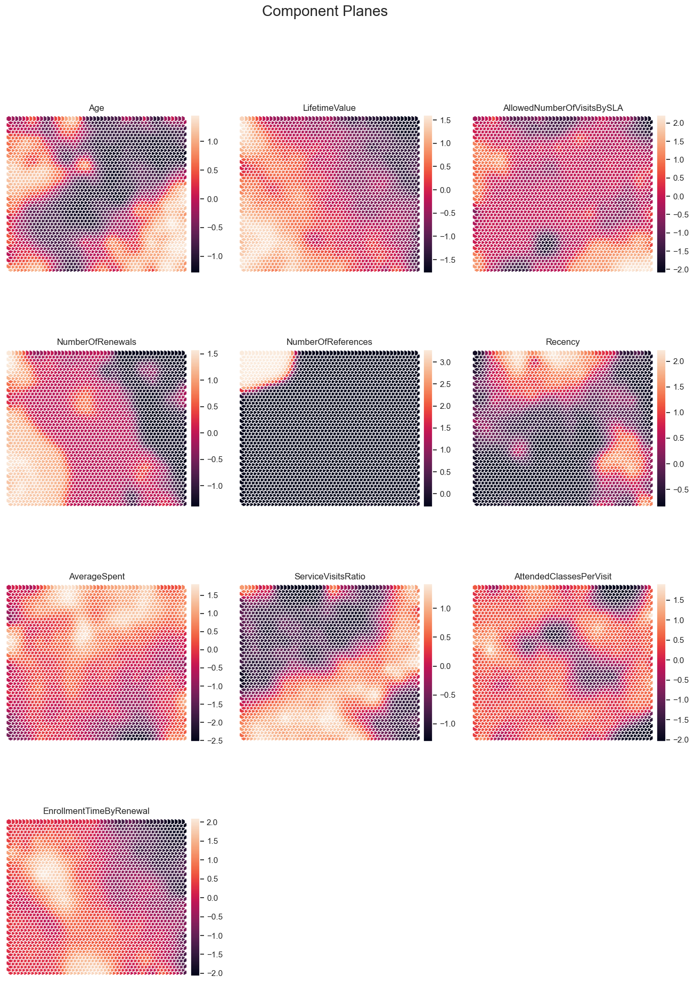

In [127]:
# Get the component planes for the selected features
np.random.seed(42)

sm = sompy.SOMFactory().build(
    df_robust.values, 
    mapsize=[50,50], 
    initialization='random',
    neighborhood='gaussian',
    training='batch',
    lattice='hexa',
    component_names=feats_corr
)

sm.train(n_job=4, verbose='info', train_rough_len=100, train_finetune_len=100)

# Component planes on the 50x50 grid
sns.set()
view2D = View2D(12,12,"", text_size=10)
view2D.show(sm, col_sz=3, what='codebook')
plt.subplots_adjust(top=0.90)
plt.suptitle("Component Planes", fontsize=20)
plt.show()

<div class="alert alert-block alert-info">


# Clustering


In [128]:
def get_r2_hc(df, link_method, max_nclus, min_nclus=1, dist='euclidean'):
    """This function computes the R2 for a set of cluster solutions given by the application of a hierarchical method.
    The R2 is a measure of the homogenity of a cluster solution. It is based on SSt = SSw + SSb and R2 = SSb/SSt. 
    
    Parameters:
    df (DataFrame): Dataset to apply clustering
    link_method (str): either "ward", "complete", "average", "single"
    max_nclus (int): maximum number of clusters to compare the methods
    min_nclus (int): minimum number of clusters to compare the methods. Defaults to 1.
    dist (str): distance to use to compute the clustering solution. Must be a valid distance. Defaults to "euclidean".
    
    Returns:
    ndarray: R2 values for the range of cluster solutions
    """
    def get_ss(df):
        ss = np.sum(df.var()*(df.count()-1))
        return ss  # return sum of sum of squares of each df variable
    
    sst = get_ss(df)  # get total sum of squares
    
    r2 = []  # where we will store the R2 metrics for each cluster solution
    
    for i in range(min_nclus, max_nclus+1):  # iterate over desired ncluster range
        cluster = AgglomerativeClustering(n_clusters=i, metric=dist, linkage=link_method)
        
        #get cluster labels
        hclabels = cluster.fit_predict(df) 
        
        # concat df with labels
        df_concat = pd.concat((df, pd.Series(hclabels, name='labels', index=df.index)), axis=1)  
        
        # compute ssw for each cluster labels
        ssw_labels = df_concat.groupby(by='labels').apply(get_ss)  
        
        # Obtain SSB. Remember: SST = SSW + SSB
        ssb =  sst - np.sum(ssw_labels)
        
        # append the R2 of the given cluster solution
        r2.append(ssb/sst)
        
    return np.array(r2)

In [129]:
def get_ss(df):
    #Computes the sum of squares for all variables given a dataset
    ss = np.sum(df.var() * (df.count() - 1))
    return ss  # return sum of sum of squares of each df variable

In [130]:
# Print the different scores for the clustering

def scores(labels, df=df_robust):
    
    sst = get_ss(df)  # get total sum of squares
    ssw_labels = df.groupby(by=labels).apply(get_ss)  # compute ssw for each cluster labels
    ssb = sst - np.sum(ssw_labels)  # remember: SST = SSW + SSB
    r2 = ssb / sst

    print('R2 score: ', r2)
    print('Silhouette score: ', silhouette_score(df, labels))
    print('Calinski and Harabasz score: ', calinski_harabasz_score(df, labels))
    print('Davies-Bouldin score: ', davies_bouldin_score(df, labels))
    print("Label Count : ",Counter(labels))

<div class="alert alert-block alert-success"> 

## Hierarchical Clustering


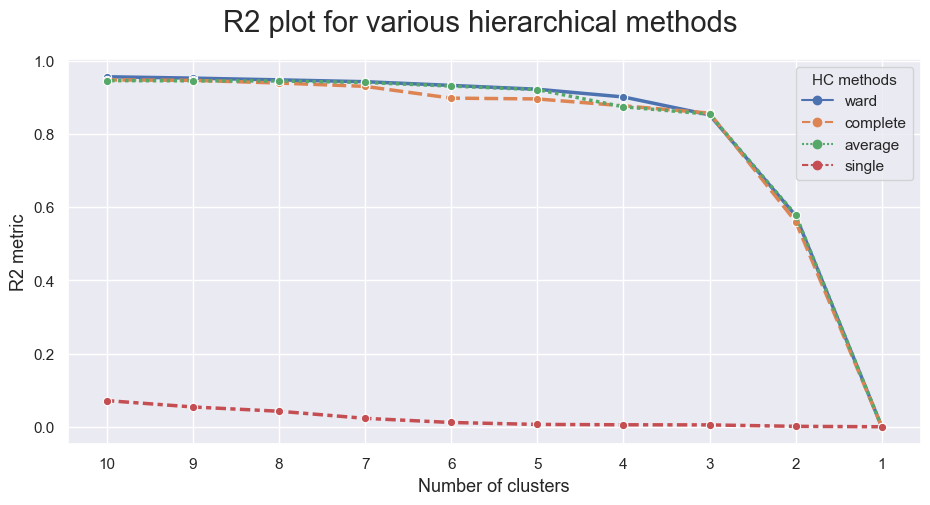

In [131]:
# Prepare input
hc_methods = ["ward", "complete", "average", "single"]
# Call function defined above to obtain the R2 statistic for each hc_method
max_nclus = 10
r2_hc_methods = np.vstack(
    [
        get_r2_hc(df=df_robust, link_method=link, max_nclus=max_nclus) 
        for link in hc_methods
    ]
).T
r2_hc_methods = pd.DataFrame(r2_hc_methods, index=range(1, max_nclus + 1), columns=hc_methods)

sns.set()
# Plot data
fig = plt.figure(figsize=(11,5))
sns.lineplot(data=r2_hc_methods, linewidth=2.5, markers=["o"]*4)

# Finalize the plot
fig.suptitle("R2 plot for various hierarchical methods", fontsize=21)
plt.gca().invert_xaxis()  # invert x axis
plt.legend(title="HC methods", title_fontsize=11)
plt.xticks(range(1, max_nclus + 1))
plt.xlabel("Number of clusters", fontsize=13)
plt.ylabel("R2 metric", fontsize=13)

plt.show()

In [132]:
linkage = 'ward'
distance = 'euclidean'

# Define the clusterer
hclust = AgglomerativeClustering(distance_threshold=0, n_clusters=None)
hclust.fit_predict(df_robust)

array([1499, 2117, 1339, ...,    2,    1,    0], dtype=int64)

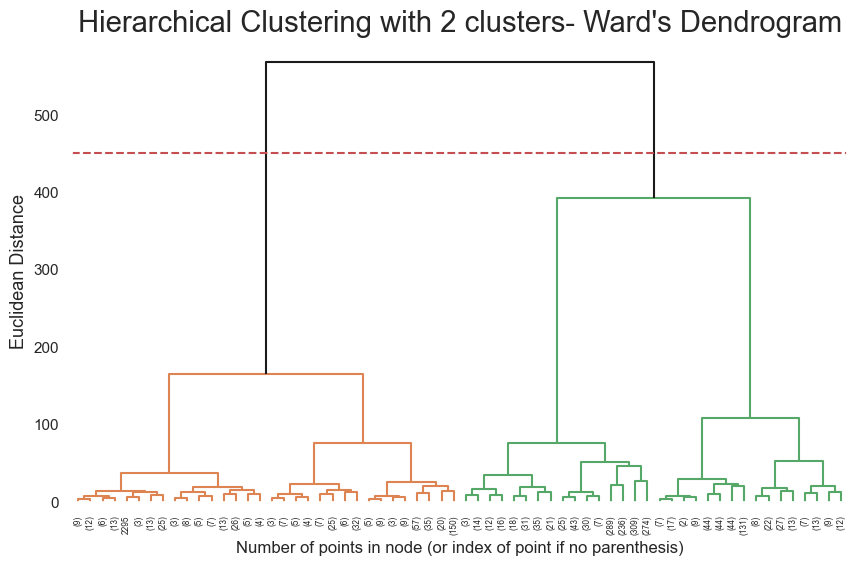

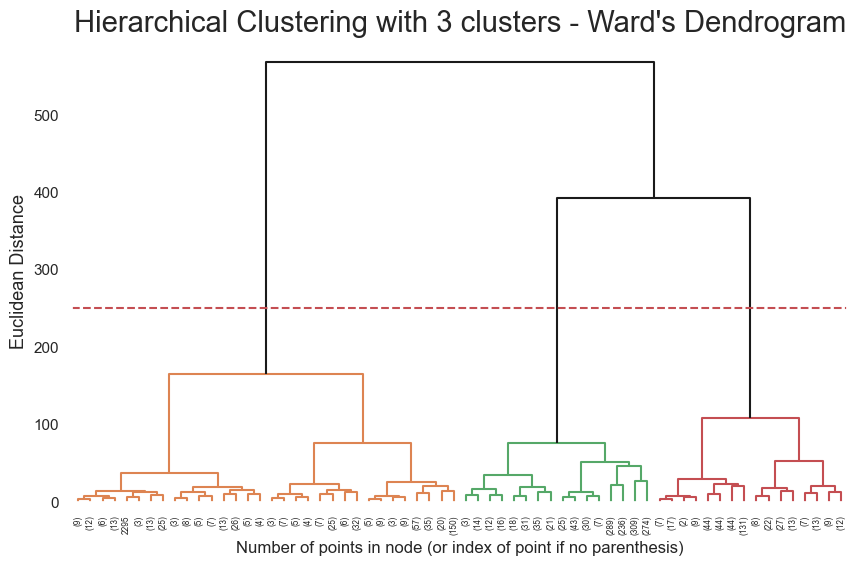

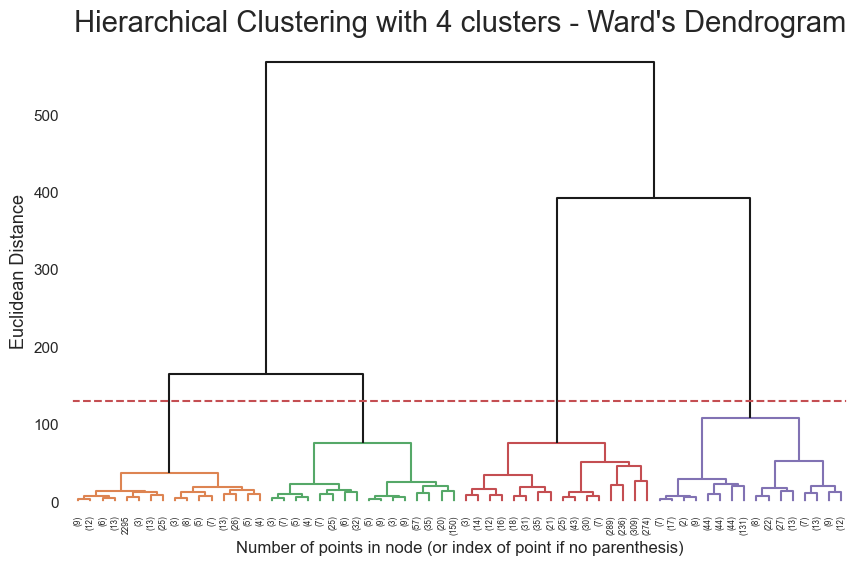

In [133]:
# Adapted from:
# https://scikit-learn.org/stable/auto_examples/cluster/plot_agglomerative_dendrogram.html#sphx-glr-auto-examples-cluster-plot-agglomerative-dendrogram-py

# create the counts of samples under each node (number of points being merged)
counts = np.zeros(hclust.children_.shape[0])
n_samples = len(hclust.labels_)

# hclust.children_ contains the observation ids that are being merged together
# At the i-th iteration, children[i][0] and children[i][1] are merged to form node n_samples + i
for i, merge in enumerate(hclust.children_):
    # track the number of observations in the current cluster being formed
    current_count = 0
    for child_idx in merge:
        if child_idx < n_samples:
            # If this is True, then we are merging an observation
            current_count += 1  # leaf node
        else:
            # Otherwise, we are merging a previously formed cluster
            current_count += counts[child_idx - n_samples]
    counts[i] = current_count

# the hclust.children_ is used to indicate the two points/clusters being merged (dendrogram's u-joins)
# the hclust.distances_ indicates the distance between the two points/clusters (height of the u-joins)
# the counts indicate the number of points being merged (dendrogram's x-axis)
linkage_matrix = np.column_stack(
    [hclust.children_, hclust.distances_, counts]
).astype(float)

# Plot the corresponding dendrogram
sns.set()
fig, ax = plt.subplots(figsize=(10, 6))
fig.patch.set_facecolor('white')
ax.set_facecolor('white')
# The Dendrogram parameters need to be tuned
y_threshold = 450
dendrogram(linkage_matrix, truncate_mode='level', p=5, color_threshold=y_threshold, above_threshold_color='k')
plt.hlines(y_threshold, 0, 1000, colors="r", linestyles="dashed")
plt.title(f'Hierarchical Clustering with 2 clusters- {linkage.title()}\'s Dendrogram', fontsize=21)
plt.xlabel('Number of points in node (or index of point if no parenthesis)')
plt.ylabel(f'{distance.title()} Distance', fontsize=13)
plt.show()

sns.set()
fig, ax = plt.subplots(figsize=(10, 6))
fig.patch.set_facecolor('white')
ax.set_facecolor('white')
# The Dendrogram parameters need to be tuned
y_threshold = 250
dendrogram(linkage_matrix, truncate_mode='level', p=5, color_threshold=y_threshold, above_threshold_color='k')
plt.hlines(y_threshold, 0, 1000, colors="r", linestyles="dashed")
plt.title(f'Hierarchical Clustering with 3 clusters - {linkage.title()}\'s Dendrogram', fontsize=21)
plt.xlabel('Number of points in node (or index of point if no parenthesis)')
plt.ylabel(f'{distance.title()} Distance', fontsize=13)
plt.show()

sns.set()
fig, ax = plt.subplots(figsize=(10, 6))
fig.patch.set_facecolor('white')
ax.set_facecolor('white')
# The Dendrogram parameters need to be tuned
y_threshold = 130
dendrogram(linkage_matrix, truncate_mode='level', p=5, color_threshold=y_threshold, above_threshold_color='k')
plt.hlines(y_threshold, 0, 1000, colors="r", linestyles="dashed")
plt.title(f'Hierarchical Clustering with 4 clusters - {linkage.title()}\'s Dendrogram', fontsize=21)
plt.xlabel('Number of points in node (or index of point if no parenthesis)')
plt.ylabel(f'{distance.title()} Distance', fontsize=13)
plt.show()

In [134]:
# 2 cluster solution
hc2lust = AgglomerativeClustering(n_clusters=2)
hc2_labels = hc2lust.fit_predict(df_robust)

# Characterizing the final clusters
df2 = pd.DataFrame(scaler.inverse_transform(df_robust), index=df_robust.index, columns=df_robust.columns)
df2_concat = pd.concat((df2, pd.Series(hc2_labels, name='labels', index=df_robust.index)), axis=1)

display(Markdown("### Table 1: Hierarchical Clustering with 2 clusters"))
scores(hc2_labels)

cluster_means_2 = df2_concat.groupby('labels').mean()[feats_corr].T
display(cluster_means_2.style.format(precision=2).background_gradient(axis=1))

# 3 cluster solution-----------------------------------------------------------------------------
hc3lust = AgglomerativeClustering(n_clusters=3)
hc3_labels = hc3lust.fit_predict(df_robust)

# Characterizing the final clusters
df3 = pd.DataFrame(scaler.inverse_transform(df_robust), index=df_robust.index, columns=df_robust.columns)
df3_concat = pd.concat((df3, pd.Series(hc3_labels, name='labels', index=df_robust.index)), axis=1)

display(Markdown("### Table 1: Hierarchical Clustering with 3 clusters"))
scores(hc3_labels)

cluster_means_3 = df3_concat.groupby('labels').mean()[feats_corr].T
display(cluster_means_3.style.format(precision=2).background_gradient(axis=1))


# 4 cluster solution----------------------------------------------------------------------------------
hc4lust = AgglomerativeClustering(n_clusters=4)
hc4_labels = hc4lust.fit_predict(df_robust)

# Characterizing the final clusters
df4 = pd.DataFrame(scaler.inverse_transform(df_robust), index=df_robust.index, columns=df_robust.columns)
df4_concat = pd.concat((df4, pd.Series(hc4_labels, name='labels', index=df_robust.index)), axis=1)

display(Markdown("### Table 2: Hierarchical Clustering with 4 clusters"))
scores(hc4_labels)

cluster_means_4 = df4_concat.groupby('labels').mean()[feats_corr].T
display(cluster_means_4.style.format(precision=2).background_gradient(axis=1))

### Table 1: Hierarchical Clustering with 2 clusters

R2 score:  0.5770801529825957
Silhouette score:  0.6055862000773055
Calinski and Harabasz score:  3138.382748458142
Davies-Bouldin score:  0.5859206590958003
Label Count :  Counter({0: 1772, 1: 530})


labels,0,1
Age,6.46,10.50
LifetimeValue,-0.02,0.08
AllowedNumberOfVisitsBySLA,-0.40,1.40
NumberOfRenewals,-0.00,0.00
NumberOfReferences,0.01,-0.02
Recency,452.97,537.58
AverageSpent,0.13,-0.44
ServiceVisitsRatio,0.08,-0.29
AttendedClassesPerVisit,0.06,-0.25
EnrollmentTimeByRenewal,-0.01,0.04


### Table 1: Hierarchical Clustering with 3 clusters

R2 score:  0.8518600862881102
Silhouette score:  0.6812556164734882
Calinski and Harabasz score:  6610.056295109029
Davies-Bouldin score:  0.4628155885111227
Label Count :  Counter({2: 1363, 0: 530, 1: 409})


labels,0,1,2
Age,10.50,7.21,6.23
LifetimeValue,0.08,-0.41,0.09
AllowedNumberOfVisitsBySLA,1.40,-1.48,-0.07
NumberOfRenewals,0.00,-0.18,0.05
NumberOfReferences,-0.02,0.09,-0.02
Recency,537.58,676.63,385.85
AverageSpent,-0.44,0.40,0.05
ServiceVisitsRatio,-0.29,0.26,0.03
AttendedClassesPerVisit,-0.25,-0.03,0.09
EnrollmentTimeByRenewal,0.04,-0.23,0.06


### Table 2: Hierarchical Clustering with 4 clusters

R2 score:  0.9008465198896729
Silhouette score:  0.6650886726666452
Calinski and Harabasz score:  6959.397022350419
Davies-Bouldin score:  0.5113183459647344
Label Count :  Counter({2: 1363, 0: 409, 1: 377, 3: 153})


labels,0,1,2,3
Age,7.21,10.02,6.23,11.67
LifetimeValue,-0.41,0.15,0.09,-0.09
AllowedNumberOfVisitsBySLA,-1.48,1.11,-0.07,2.12
NumberOfRenewals,-0.18,0.07,0.05,-0.17
NumberOfReferences,0.09,0.01,-0.02,-0.09
Recency,676.63,480.87,385.85,677.31
AverageSpent,0.40,-0.42,0.05,-0.47
ServiceVisitsRatio,0.26,-0.19,0.03,-0.54
AttendedClassesPerVisit,-0.03,0.08,0.09,-1.06
EnrollmentTimeByRenewal,-0.23,0.09,0.06,-0.09


### SOM for hierarchical clustering

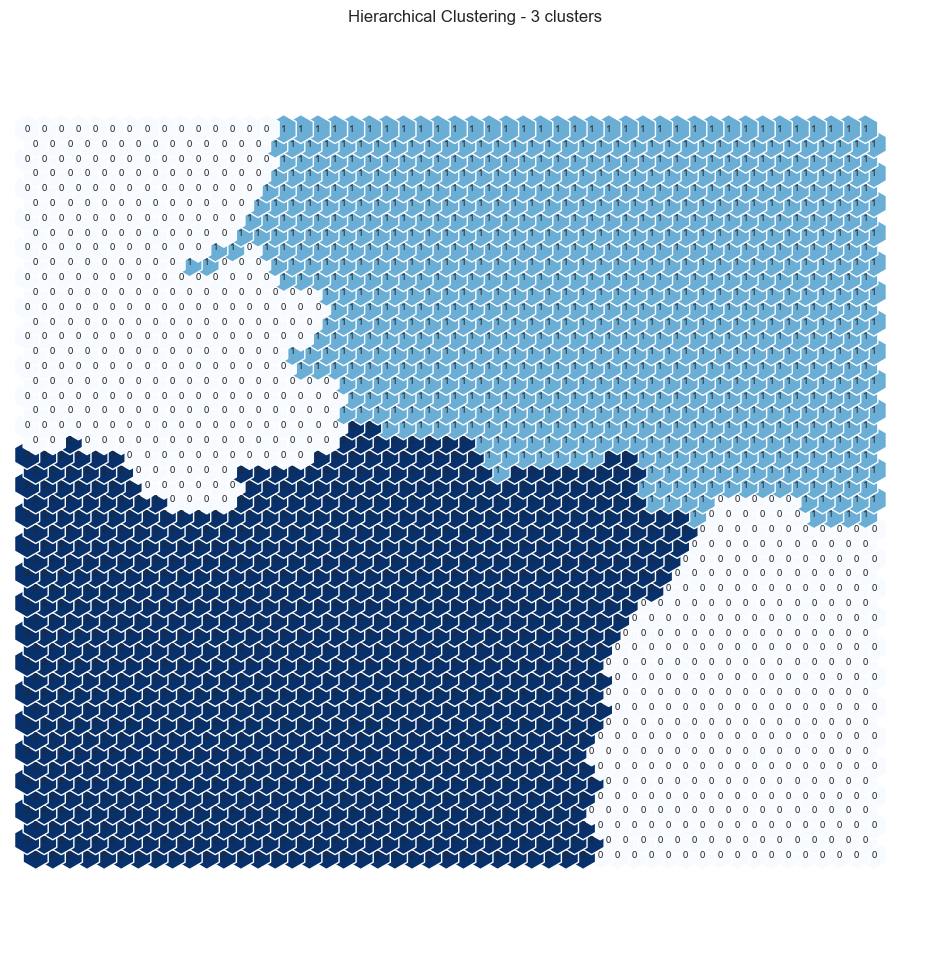

In [135]:
hierclust = AgglomerativeClustering(n_clusters=3, linkage='ward')
nodeclus_labels = hierclust.fit_predict(sm.codebook.matrix)
sm.cluster_labels = nodeclus_labels  # setting the cluster labels of sompy

hits  = HitMapView(12, 12,"Hierarchical Clustering - 3 clusters",text_size=10)
hits.show(sm, anotate=True, onlyzeros=False, labelsize=7, cmap="Blues")

plt.show()

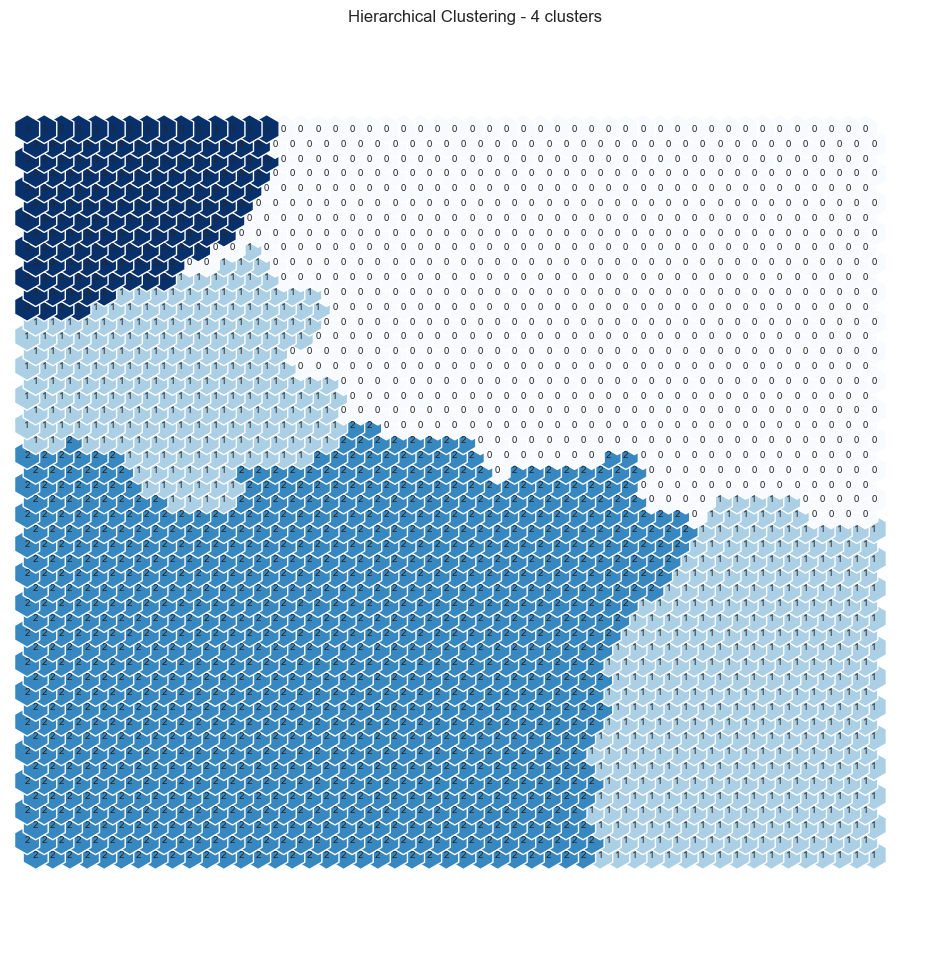

In [136]:
hierclust = AgglomerativeClustering(n_clusters=4, linkage='ward')
nodeclus_labels = hierclust.fit_predict(sm.codebook.matrix)
sm.cluster_labels = nodeclus_labels  # setting the cluster labels of sompy

hits  = HitMapView(12, 12,"Hierarchical Clustering - 4 clusters",text_size=10)
hits.show(sm, anotate=True, onlyzeros=False, labelsize=7, cmap="Blues")

plt.show()

### t-SNE for hierarchical clustering

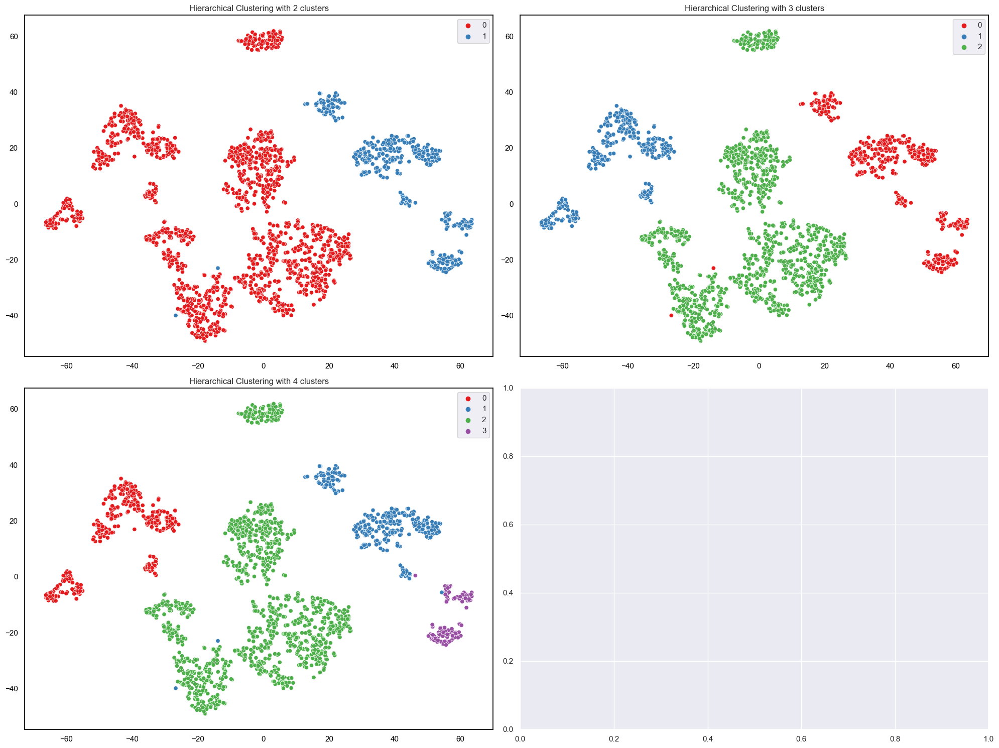

In [137]:
# Perform t-SNE
tsne = TSNE()
visualization = tsne.fit_transform(df_robust)

# Set a white background for the entire figure
fig, axes = plt.subplots(2, 2, figsize=(20, 15))
fig.patch.set_facecolor('white')

# Iterate over subplots to customize each one
for i, ax in enumerate(axes.flatten(), start=2):
    n_clusters = i
    cluster_labels_key = f'hc{n_clusters}_labels'
    
    # Check if the variable exists before accessing it
    if cluster_labels_key in locals():
        cluster_labels = locals()[cluster_labels_key]
        
        # Scatterplot with a black frame
        sns.scatterplot(x=visualization[:, 0], y=visualization[:, 1],
                        hue=cluster_labels,
                        palette=sns.color_palette('Set1', n_colors=n_clusters),
                        ax=ax)
        
        # Set the background color of the plot area to white
        ax.set_facecolor('white')
        
        # Set the color of the frame to black
        ax.spines['bottom'].set_color('black')
        ax.spines['top'].set_color('black')
        ax.spines['right'].set_color('black')
        ax.spines['left'].set_color('black')
        
        # Set the color of the tick labels to black
        ax.tick_params(axis='x', colors='black')
        ax.tick_params(axis='y', colors='black')
        
        ax.set_title(f'Hierarchical Clustering with {n_clusters} clusters')

# Adjust layout
plt.tight_layout()
plt.show()

<div class="alert alert-block alert-success">

## K Means Clustering


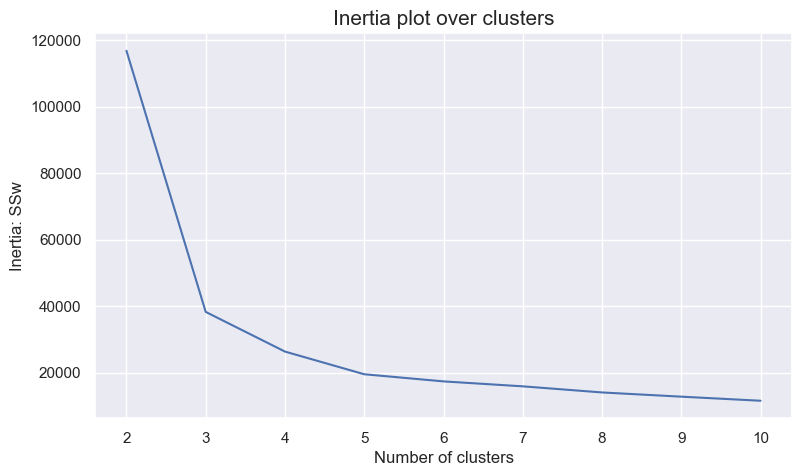

In [138]:
range_clusters = list(range(2,11))
inertia = []
for n_clus in range_clusters:  # iterate over desired ncluster range
    kmclust = kmclust = KMeans(n_clusters=n_clus, init='k-means++', n_init=15, random_state=1)
    kmclust.fit(df_robust)
    inertia.append(kmclust.inertia_)  # save the inertia of the given cluster solution

# The inertia plot
plt.figure(figsize=(9,5))
plt.plot(range_clusters, inertia)
plt.ylabel("Inertia: SSw")
plt.xlabel("Number of clusters")
plt.title("Inertia plot over clusters", size=15)
plt.show()

For n_clusters = 2, the average silhouette_score is : 0.6177837521357423
For n_clusters = 3, the average silhouette_score is : 0.6934357908982524
For n_clusters = 4, the average silhouette_score is : 0.680862991423662
For n_clusters = 5, the average silhouette_score is : 0.6655110827445851
For n_clusters = 6, the average silhouette_score is : 0.5167520479311652
For n_clusters = 7, the average silhouette_score is : 0.3515993917218315
For n_clusters = 8, the average silhouette_score is : 0.45674848460410805
For n_clusters = 9, the average silhouette_score is : 0.3443783297357555
For n_clusters = 10, the average silhouette_score is : 0.37187474423043076


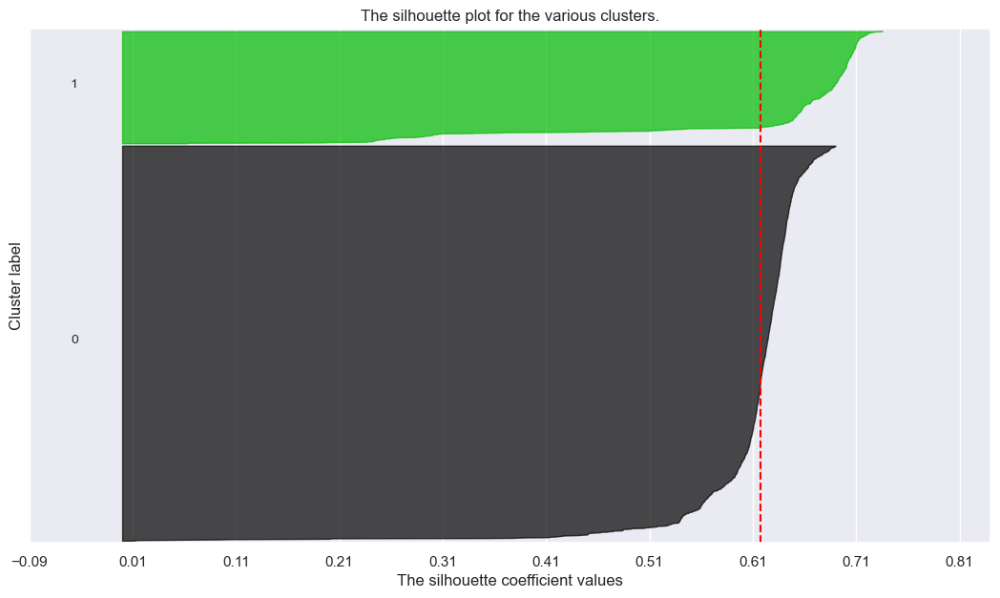

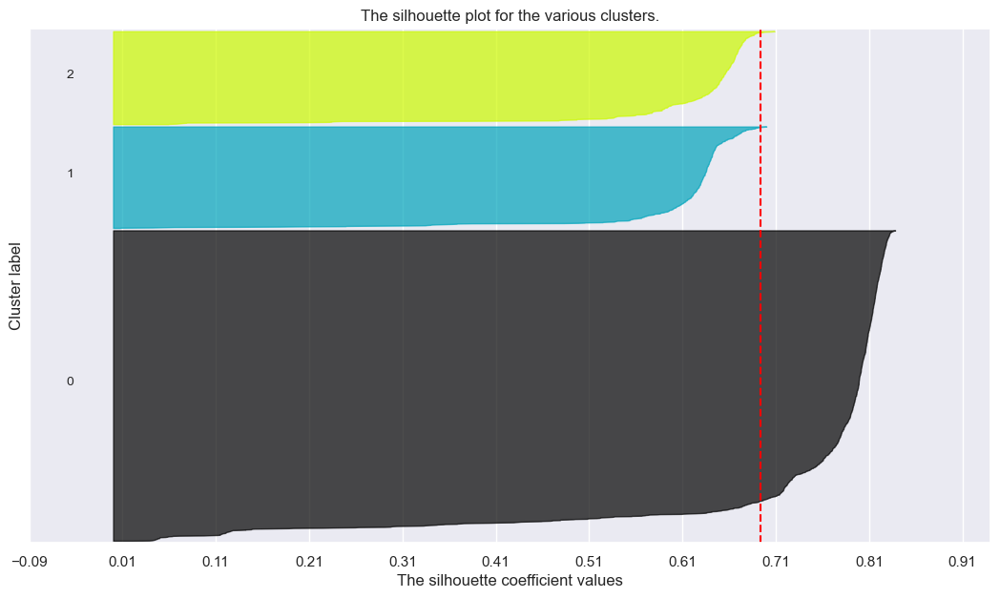

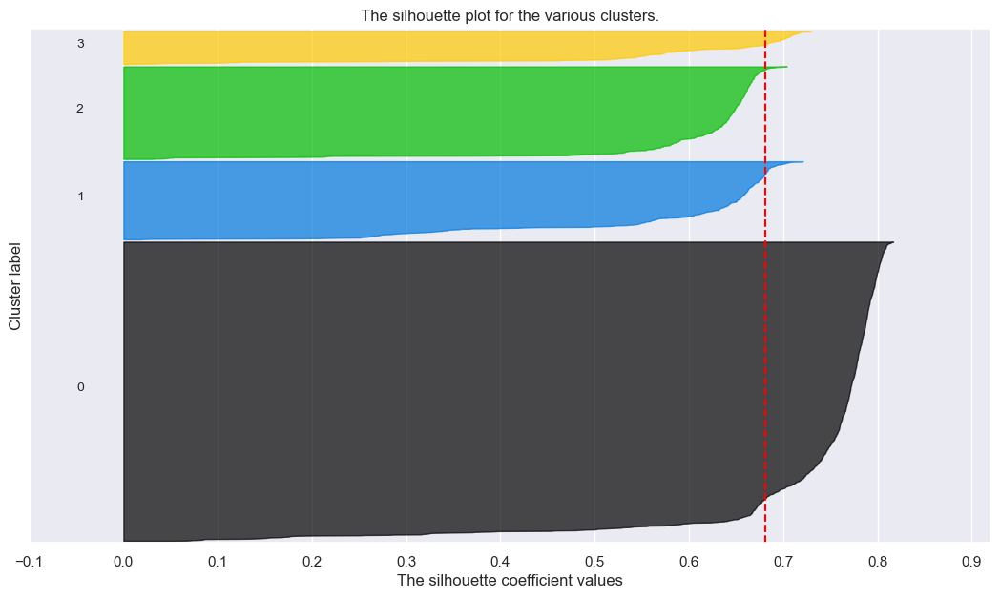

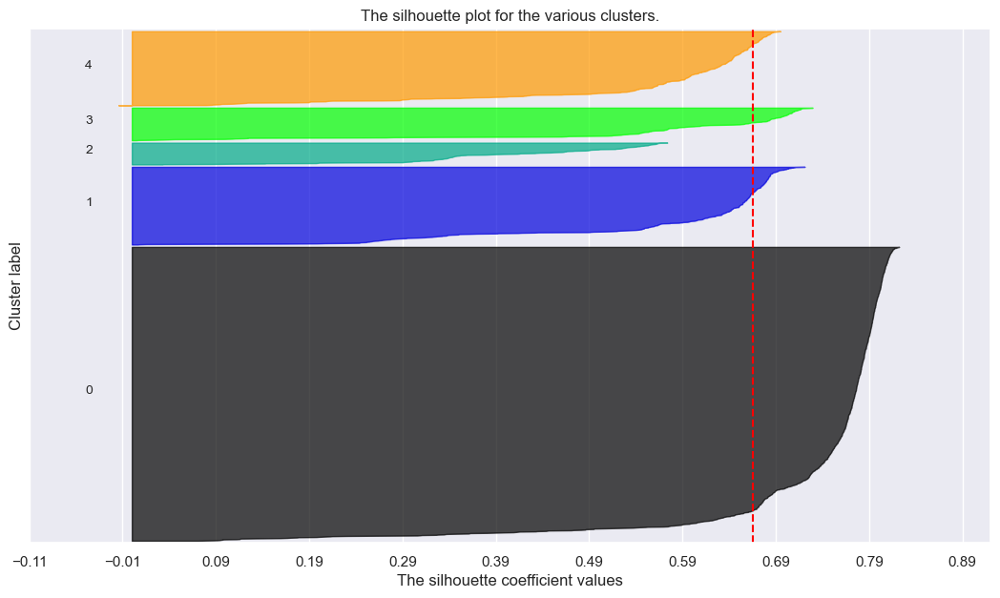

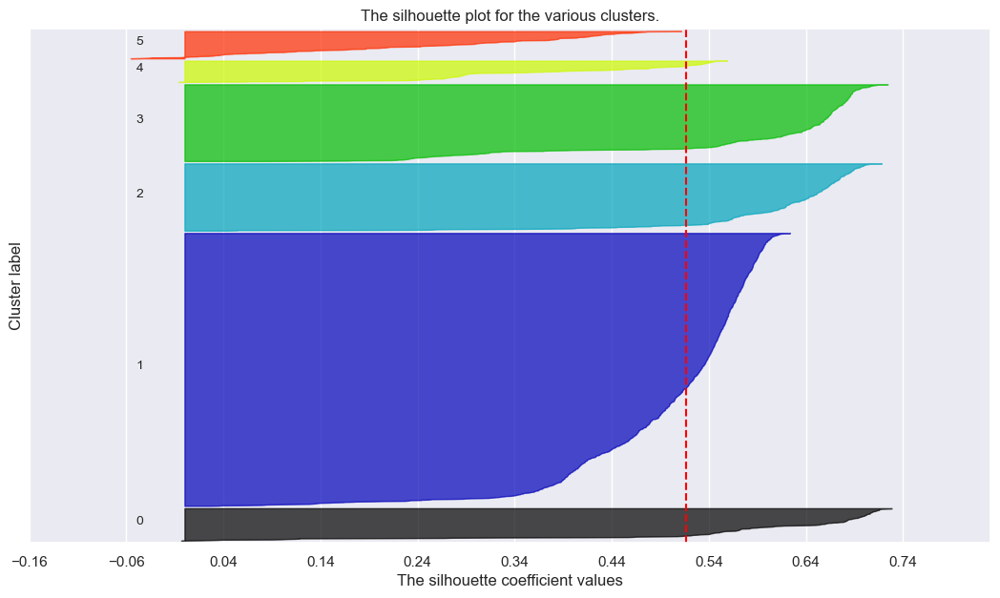

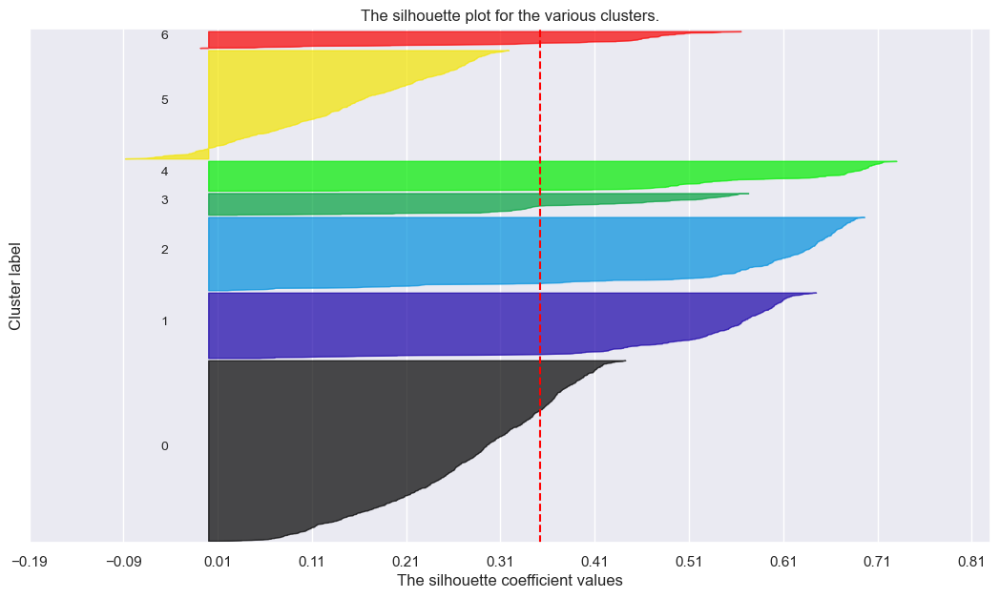

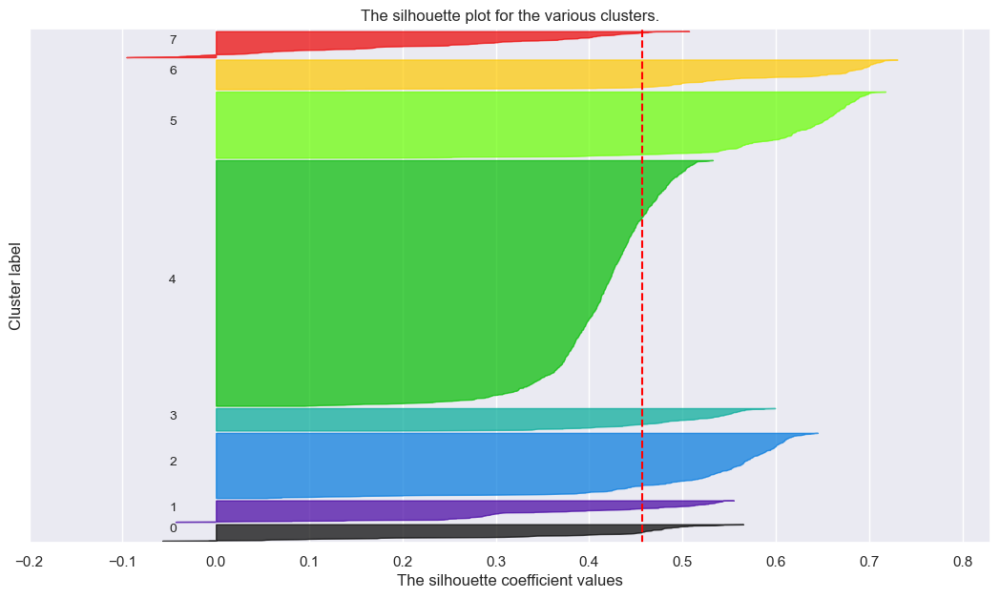

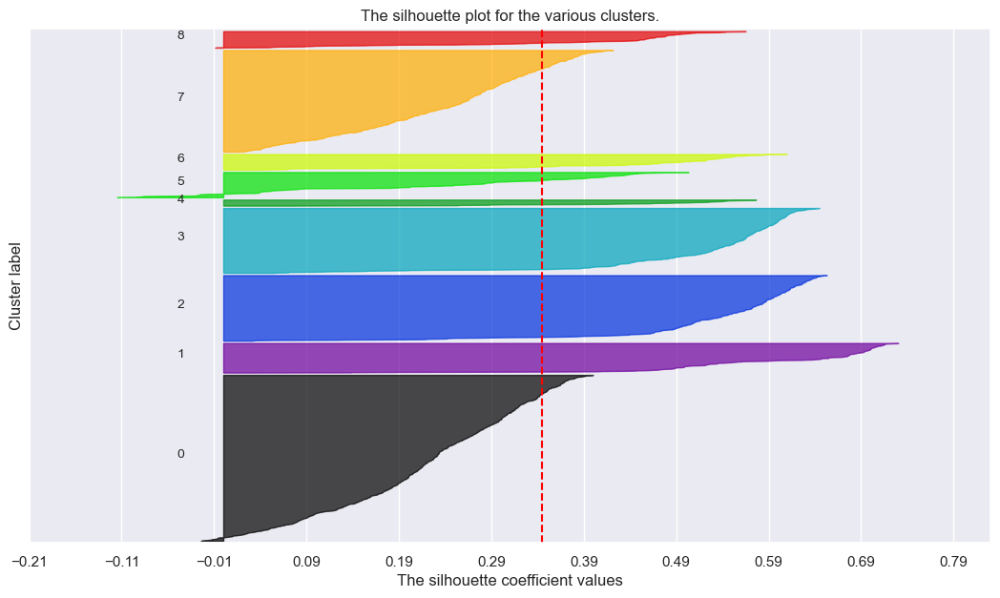

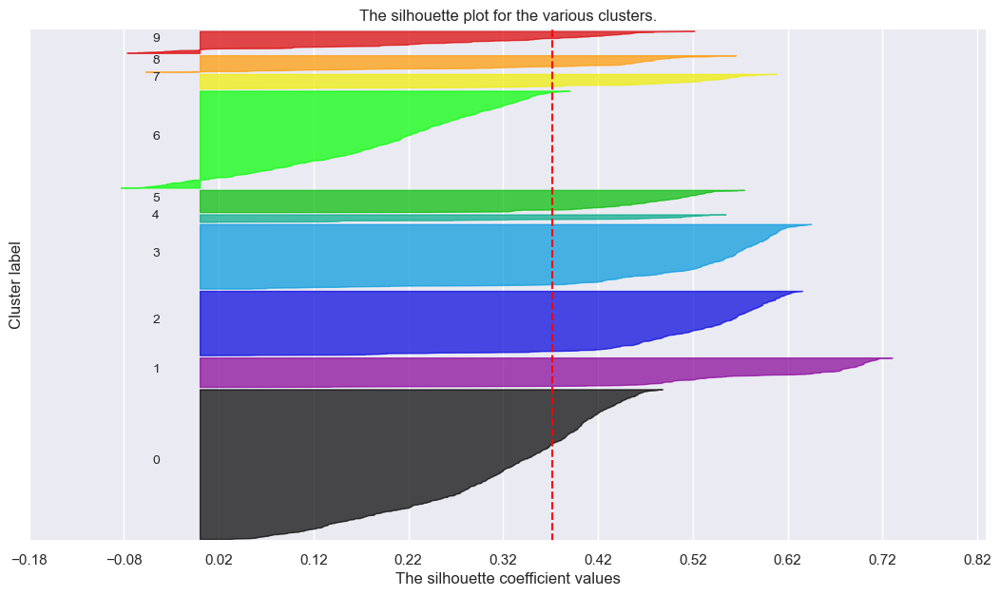

In [139]:
# Adapted from:
# https://scikit-learn.org/stable/auto_examples/cluster/plot_kmeans_silhouette_analysis.html#sphx-glr-auto-examples-cluster-plot-kmeans-silhouette-analysis-py

# Storing average silhouette metric
avg_silhouette = []
for nclus in range_clusters:
    # Skip nclus == 1
    if nclus == 1:
        continue
    
    # Create a figure
    fig = plt.figure(figsize=(13, 7))

    # Initialize the KMeans object with n_clusters value and a random generator
    # seed of 10 for reproducibility.
    kmclust = KMeans(n_clusters=nclus, init='k-means++', n_init=15, random_state=1)
    cluster_labels = kmclust.fit_predict(df_robust)

    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed clusters
    silhouette_avg =  silhouette_score(df_robust, cluster_labels)
    avg_silhouette.append(silhouette_avg)
    print(f"For n_clusters = {nclus}, the average silhouette_score is : {silhouette_avg}")

    # Compute the silhouette scores for each sample
    sample_silhouette_values =  silhouette_samples(df_robust, cluster_labels)

    y_lower = 10
    for i in range(nclus):
        # Aggregate the silhouette scores for samples belonging to cluster i, and sort them
        ith_cluster_silhouette_values = sample_silhouette_values[cluster_labels == i]
        ith_cluster_silhouette_values.sort()
        
        # Get y_upper to demarcate silhouette y range size
        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i
        
        # Filling the silhouette
        color = cm.nipy_spectral(float(i) / nclus)
        plt.fill_betweenx(np.arange(y_lower, y_upper),
                          0, ith_cluster_silhouette_values,
                          facecolor=color, edgecolor=color, alpha=0.7)

        # Label the silhouette plots with their cluster numbers at the middle
        plt.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    plt.title("The silhouette plot for the various clusters.")
    plt.xlabel("The silhouette coefficient values")
    plt.ylabel("Cluster label")

    # The vertical line for average silhouette score of all the values
    plt.axvline(x=silhouette_avg, color="red", linestyle="--")
    
    # The silhouette coefficient can range from -1, 1
    xmin, xmax = np.round(sample_silhouette_values.min() -0.1, 2), np.round(sample_silhouette_values.max() + 0.1, 2)
    plt.xlim([xmin, xmax])
    
    # The (nclus+1)*10 is for inserting blank space between silhouette
    # plots of individual clusters, to demarcate them clearly.
    plt.ylim([0, len(df_robust) + (nclus + 1) * 10])

    plt.yticks([])  # Clear the yaxis labels / ticks
    plt.xticks(np.arange(xmin, xmax, 0.1))

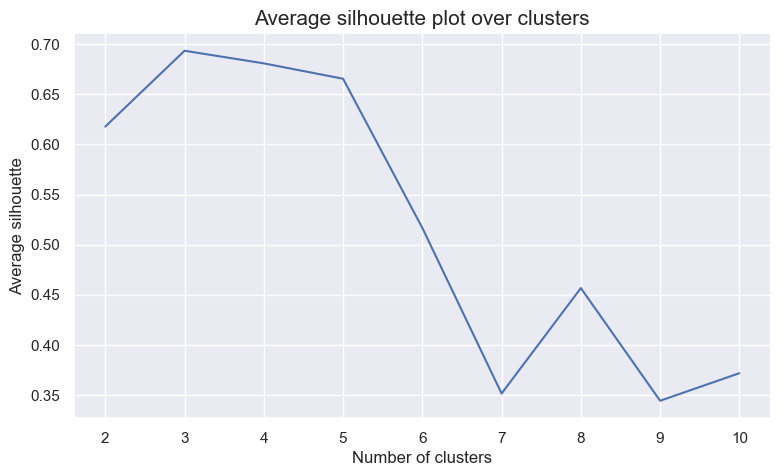

In [140]:
# The average silhouette plot
# The inertia plot
plt.figure(figsize=(9,5))
plt.plot(range_clusters, ## Plot X-axis; Why range_clusters[1:] ? Remember we skipped k=1 in the cell above
         avg_silhouette)     ## Plot Y-axis
plt.ylabel("Average silhouette")
plt.xlabel("Number of clusters")
plt.title("Average silhouette plot over clusters", size=15)
plt.show()

In [141]:
# 3 cluster solution
number_clusters =  3
kmclust3 = KMeans(n_clusters=number_clusters, init='k-means++', n_init=50, random_state=42)
km3_labels = kmclust3.fit_predict(df_robust)

# Characterizing the final clusters
df[feats_corr] = pd.DataFrame(scaler.inverse_transform(scaled_data), index=df_robust.index, columns=df_robust.columns)
df[features_transform] = pd.DataFrame(pt2.inverse_transform(df[features_transform]), index=df[features_transform].index, columns=df[features_transform].columns)
df3_concat_km = pd.concat((df, pd.Series(km3_labels, name='labels', index=df.index)), axis=1)

# With style
cluster_means_3 = df3_concat_km.groupby('labels').mean().T
display(Markdown("### Table 1: Kmeans Clustering with 3 clusters"))
display(cluster_means_3.style.format(precision=2).background_gradient(axis=1))
scores(km3_labels)

# ----------------------

# 4 cluster solution
number_clusters =  4
kmclust4 = KMeans(n_clusters=number_clusters, init='k-means++', n_init=50, random_state=42)
km4_labels = kmclust4.fit_predict(df_robust)

# Characterizing the final clusters
df4_concat = pd.concat((df, pd.Series(km4_labels, name='labels', index=df.index)), axis=1)

# With style
cluster_means_4 = df4_concat.groupby('labels').mean().T
display(Markdown("### Table 2: Kmeans Clustering with 4 clusters"))
display(cluster_means_4.style.format(precision=2).background_gradient(axis=1))
scores(km4_labels)

# ----------------------

# 5 cluster solution
number_clusters =  5
kmclust5 = KMeans(n_clusters=number_clusters, init='k-means++', n_init=50, random_state=42)
km5_labels = kmclust5.fit_predict(df_robust)

# Characterizing the final clusters
df5_concat = pd.concat((df, pd.Series(km5_labels, name='labels', index=df.index)), axis=1)

# With style
cluster_means_5 = df5_concat.groupby('labels').mean().T
display(Markdown("### Table 3: Kmeans Clustering with 5 clusters"))
display(cluster_means_5.style.format(precision=2).background_gradient(axis=1))
scores(km5_labels)

### Table 1: Kmeans Clustering with 3 clusters

labels,0,1,2
Age,6.40,10.62,7.18
DaysWithoutFrequency,59.09,72.78,95.51
LifetimeValue,636.12,667.62,424.51
UseByTime,0.00,0.01,0.00
AthleticsActivities,0.01,0.00,0.01
WaterActivities,0.91,0.65,0.64
FitnessActivities,0.00,0.03,0.00
DanceActivities,0.00,0.00,0.00
TeamActivities,0.09,0.21,0.17
RacketActivities,0.02,0.00,0.08


R2 score:  0.8630348061849711
Silhouette score:  0.6934357908982524
Calinski and Harabasz score:  7243.143181686005
Davies-Bouldin score:  0.4424400975782598
Label Count :  Counter({0: 1415, 1: 463, 2: 424})


### Table 2: Kmeans Clustering with 4 clusters

labels,0,1,2,3
Age,6.29,11.70,7.18,10.02
DaysWithoutFrequency,56.85,68.99,95.51,81.19
LifetimeValue,640.25,582.61,424.51,683.64
UseByTime,0.00,0.02,0.00,0.00
AthleticsActivities,0.01,0.01,0.01,0.01
WaterActivities,0.92,0.41,0.64,0.78
FitnessActivities,0.00,0.05,0.00,0.01
DanceActivities,0.00,0.00,0.00,0.00
TeamActivities,0.08,0.14,0.17,0.25
RacketActivities,0.02,0.01,0.08,0.01


R2 score:  0.9057412019673887
Silhouette score:  0.680862991423662
Calinski and Harabasz score:  7360.562357977285
Davies-Bouldin score:  0.4991295452737828
Label Count :  Counter({0: 1369, 2: 424, 3: 358, 1: 151})


### Table 3: Kmeans Clustering with 5 clusters

labels,0,1,2,3,4
Age,6.31,11.70,7.19,10.02,6.76
DaysWithoutFrequency,56.97,68.99,111.49,81.19,33.05
LifetimeValue,640.96,582.61,416.82,683.64,479.34
UseByTime,0.00,0.02,0.00,0.00,0.00
AthleticsActivities,0.01,0.01,0.01,0.01,0.01
WaterActivities,0.92,0.41,0.62,0.78,0.79
FitnessActivities,0.00,0.05,0.00,0.01,0.00
DanceActivities,0.00,0.00,0.00,0.00,0.00
TeamActivities,0.08,0.14,0.16,0.25,0.18
RacketActivities,0.02,0.01,0.10,0.01,0.01


R2 score:  0.9301463097052873
Silhouette score:  0.6655110827445851
Calinski and Harabasz score:  7646.503944097155
Davies-Bouldin score:  0.5995927182078185
Label Count :  Counter({0: 1351, 3: 358, 2: 341, 1: 151, 4: 101})


### SOM for KMeans

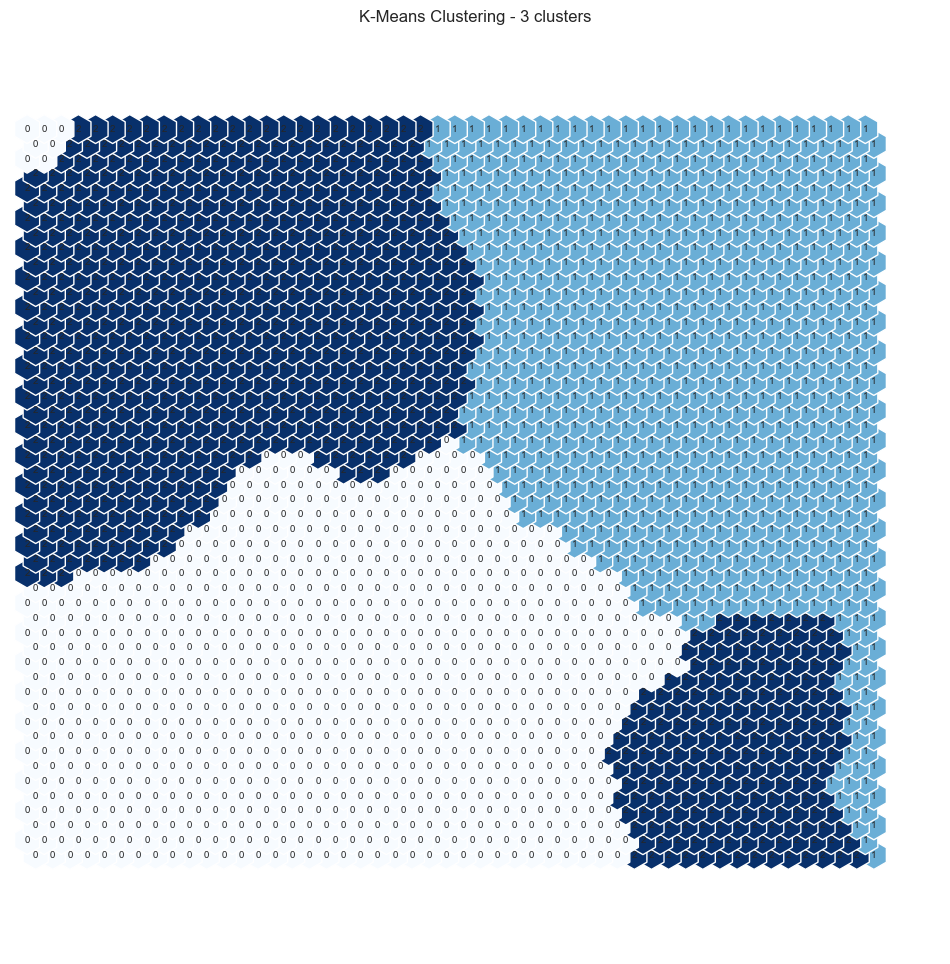

In [142]:
# Perform K-Means clustering on top of the 2500 units (sm.get_node_vectors() output)
kmeans = KMeans(n_clusters=3, init='k-means++', n_init=20, random_state=42)
nodeclus_labels_km3 = kmeans.fit_predict(sm.codebook.matrix)
sm.cluster_labels = nodeclus_labels_km3  # setting the cluster labels of sompy

hits = HitMapView(12, 12,"K-Means Clustering - 3 clusters", text_size=10)
hits.show(sm, anotate=True, onlyzeros=False, labelsize=7, cmap="Blues")

plt.show()

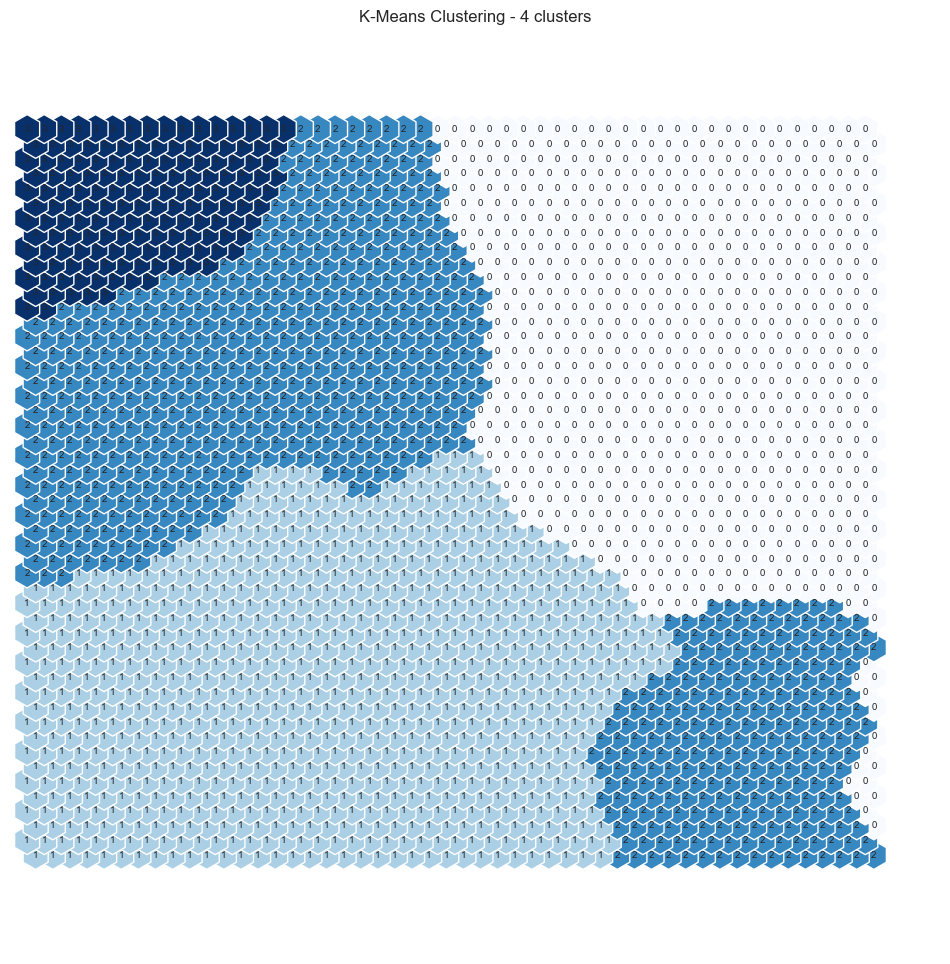

In [143]:
# Perform K-Means clustering on top of the 2500 units (sm.get_node_vectors() output)
kmeans = KMeans(n_clusters=4, init='k-means++', n_init=20, random_state=42)
nodeclus_labels = kmeans.fit_predict(sm.codebook.matrix)
sm.cluster_labels = nodeclus_labels  # setting the cluster labels of sompy

hits = HitMapView(12, 12,"K-Means Clustering - 4 clusters", text_size=10)
hits.show(sm, anotate=True, onlyzeros=False, labelsize=7, cmap="Blues")

plt.show()

### t-SNE for KMeans

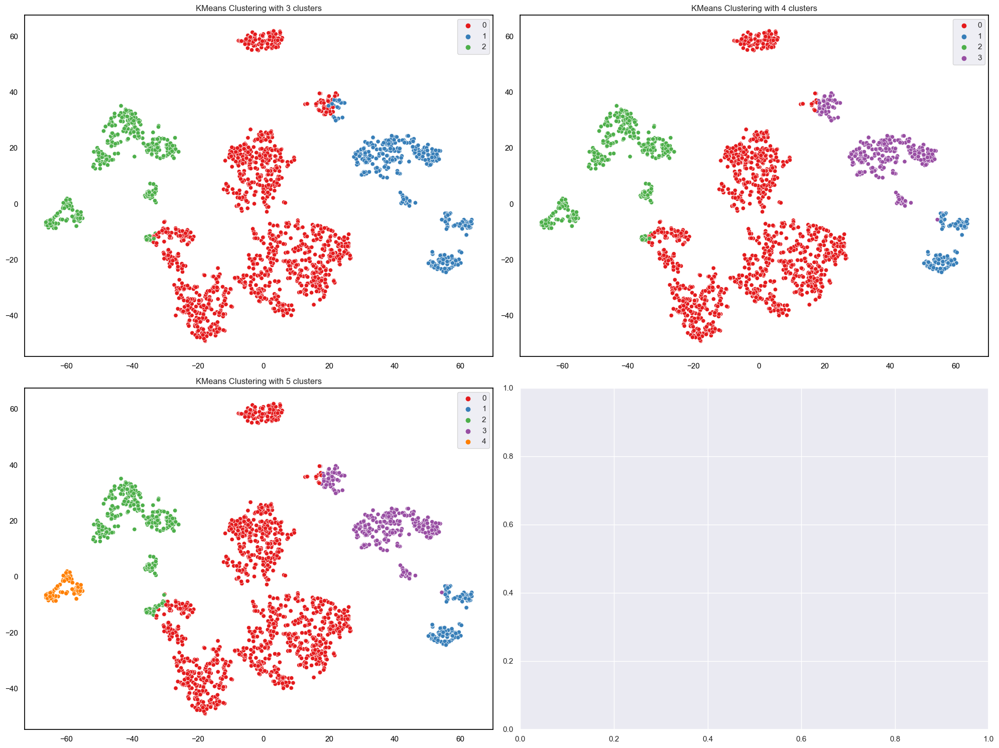

In [144]:
# Perform t-SNE
tsne = TSNE()
visualization = tsne.fit_transform(df_robust)

# Set a white background for the entire figure
fig, axes = plt.subplots(2, 2, figsize=(20, 15))
fig.patch.set_facecolor('white')

# Iterate over subplots to customize each one
for i, ax in enumerate(axes.flatten(), start=3):
    n_clusters = i
    cluster_labels_key = f'km{n_clusters}_labels'
    
    # Check if the variable exists before accessing it
    if cluster_labels_key in locals():
        cluster_labels = locals()[cluster_labels_key]
        
        # Scatterplot with a black frame
        sns.scatterplot(x=visualization[:, 0], y=visualization[:, 1],
                        hue=cluster_labels,
                        palette=sns.color_palette('Set1', n_colors=n_clusters),
                        ax=ax)
        
        # Set the background color of the plot area to white
        ax.set_facecolor('white')
        
        # Set the color of the frame to black
        ax.spines['bottom'].set_color('black')
        ax.spines['top'].set_color('black')
        ax.spines['right'].set_color('black')
        ax.spines['left'].set_color('black')
        
        # Set the color of the tick labels to black
        ax.tick_params(axis='x', colors='black')
        ax.tick_params(axis='y', colors='black')
        
        ax.set_title(f'KMeans Clustering with {n_clusters} clusters')

# Adjust layout
plt.tight_layout()
plt.show()

<div class="alert alert-block alert-success">

## Mean Shift Clustering


In [145]:
# The following bandwidth can be automatically detected using (we need to set quantile though)
# Based on distance to nearest neighbors for all observations
bandwidth = estimate_bandwidth(df_robust, random_state=1, n_jobs=-1, quantile = 0.36)
# TO-DO: manipulate the quantile value such that we obtain a small enough bandwidth
bandwidth

8.657959019164029

In [146]:
# Perform mean-shift clustering with bandwidth set using estimate_bandwidth
ms = MeanShift(bandwidth=bandwidth, bin_seeding=True)
ms_labels = ms.fit_predict(df_robust)

ms_n_clusters = len(np.unique(ms_labels))
print("Number of estimated clusters : %d" % ms_n_clusters)

Number of estimated clusters : 4


In [147]:
# Characterizing the final clusters
df_concat = pd.concat((df, pd.Series(ms_labels, name='labels', index=df.index)), axis=1)

# With style
cluster_mean_shift= df_concat.groupby('labels').mean().T
display(Markdown("### Table 3: Mean Shift Clustering with 4 clusters"))
display(cluster_mean_shift.style.format(precision=2).background_gradient(axis=1))
scores(ms_labels)

### Table 3: Mean Shift Clustering with 4 clusters

labels,0,1,2,3
Age,6.30,7.11,10.02,11.70
DaysWithoutFrequency,56.93,93.78,81.19,68.99
LifetimeValue,641.13,430.11,683.64,582.61
UseByTime,0.00,0.00,0.00,0.02
AthleticsActivities,0.01,0.01,0.01,0.01
WaterActivities,0.92,0.66,0.78,0.41
FitnessActivities,0.00,0.00,0.01,0.05
DanceActivities,0.00,0.00,0.00,0.00
TeamActivities,0.08,0.17,0.25,0.14
RacketActivities,0.02,0.08,0.01,0.01


R2 score:  0.9048344053302668
Silhouette score:  0.6801580172489073
Calinski and Harabasz score:  7283.127446304118
Davies-Bouldin score:  0.5025822575219373
Label Count :  Counter({0: 1352, 1: 441, 2: 358, 3: 151})


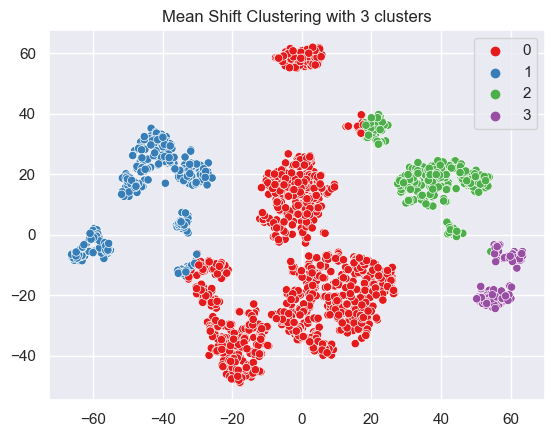

In [148]:
tsne = TSNE()
visualization = tsne.fit_transform(df_robust)

sns.scatterplot(x=visualization[:, 0], y=visualization[:, 1],
                hue=ms_labels,
                palette=sns.color_palette('Set1', n_colors=ms_n_clusters))
plt.title('Mean Shift Clustering with 3 clusters')

plt.show()

<div class="alert alert-block alert-success">
    
## DBSCAN 


In [149]:
# Perform DBSCAN clustering
dbscan = DBSCAN()
dbscan_labels = dbscan.fit_predict(df_robust)

dbscan_n_clusters = len(np.unique(dbscan_labels))
print("Number of estimated clusters : %d" % dbscan_n_clusters)


Number of estimated clusters : 13


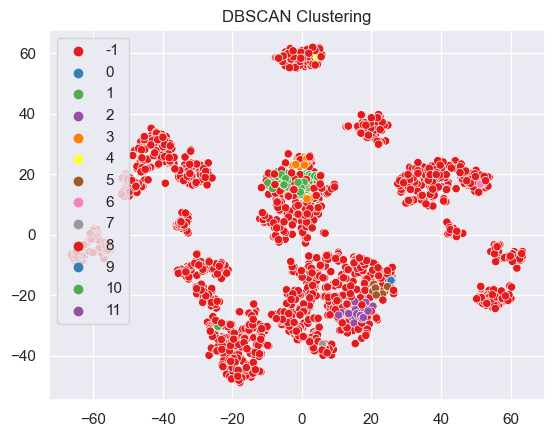

In [150]:
tsne = TSNE()
visualization = tsne.fit_transform(df_robust)

sns.scatterplot(x=visualization[:, 0], y=visualization[:, 1],
                hue=dbscan_labels,
                palette=sns.color_palette('Set1', n_colors=dbscan_n_clusters))
plt.title('DBSCAN Clustering')

plt.show()

# There are many clusters assigned, not what we want.  
# It is because the value of epsilon is very small and we didn’t optimize parameters.
# Therefore, we need to find the value of epsilon and minPoints and then train our model again.
     

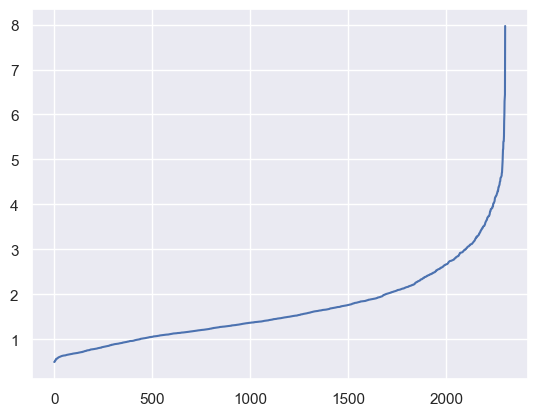

In [151]:
# K-distance graph to find out the right eps value
neigh = NearestNeighbors(n_neighbors=20)
neigh.fit(df_robust)
distances, _ = neigh.kneighbors(df_robust)
distances = np.sort(distances[:, -1])
plt.plot(distances)
plt.show()
# The optimum value of epsilon is at the point of maximum curvature in the K-Distance Graph, 
# which is around 1.3 in this case. About the value of minPoints a rule of thumb is to 
# set it to be greater than or equal to the number of dimensions D in the data set, in this case, 6 dimentions + 1 = 7.

In [152]:
# Perform DBSCAN clustering
dbscan = DBSCAN(eps=3.6,min_samples=11)
dbscan_labels = dbscan.fit_predict(df_robust)

dbscan_n_clusters = len(np.unique(dbscan_labels))
print("Number of estimated clusters : %d" % dbscan_n_clusters)

Number of estimated clusters : 3


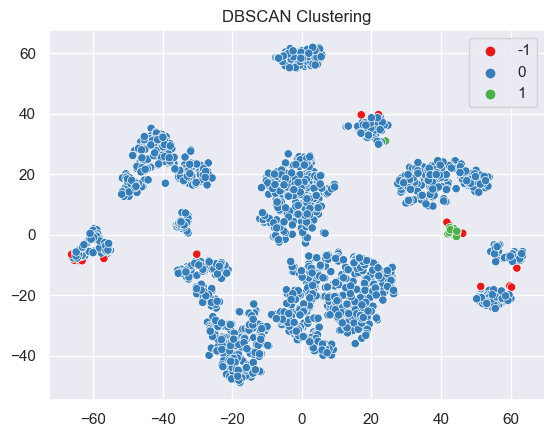

In [153]:
tsne = TSNE()
visualization = tsne.fit_transform(df_robust)

sns.scatterplot(x=visualization[:, 0], y=visualization[:, 1],
                hue=dbscan_labels,
                palette=sns.color_palette('Set1', n_colors=dbscan_n_clusters))
plt.title('DBSCAN Clustering')

plt.show()

In [154]:
# Concatenating the labels to df
df_concat = pd.concat([df[metric_features], pd.Series(dbscan_labels, index=df.index, name="dbscan_labels")], axis=1)
df_concat.head()

,Age,DaysWithoutFrequency,LifetimeValue,NumberOfFrequencies,AttendedClasses,AllowedWeeklyVisitsBySLA,AllowedNumberOfVisitsBySLA,RealNumberOfVisits,NumberOfRenewals,NumberOfReferences,Recency,EnrollmentTime,AverageSpent,ServiceVisitsRatio,AttendedClassesPerVisit,EnrollmentTimeByRenewal,dbscan_labels
ID,,,,,,,,,,,,,,,,,
10003,9.0,22.0,155.40,20.0,2.0,2.0,17.72,3.0,0.0,0.0,283.0,160.0,7.770000,0.169300,0.100000,160.000000,0
10009,14.0,74.0,253.50,6.0,6.0,2.0,17.72,0.0,1.0,0.0,1076.0,209.0,42.250000,0.000000,1.000000,209.000000,0
10013,12.0,262.0,188.60,1.0,0.0,2.0,17.42,0.0,0.0,0.0,719.0,302.0,188.600000,0.000000,0.000000,302.000000,0
10025,13.0,5.0,596.30,27.0,18.0,2.0,6.28,3.0,3.0,0.0,5.0,1513.0,22.085185,0.477707,0.666667,504.333333,0
10031,2.0,107.0,492.85,17.0,17.0,2.0,15.14,0.0,1.0,0.0,1195.0,415.0,28.991176,0.000000,1.000000,415.000000,0


In [155]:
cluster_mean_shift= df_concat.groupby('dbscan_labels').mean().T
display(Markdown("### Table 3: DBSCAN clustering with 3 clusters"))
display(cluster_mean_shift.style.format(precision=2).background_gradient(axis=1))
scores(dbscan_labels)

### Table 3: DBSCAN clustering with 3 clusters

dbscan_labels,-1,0,1
Age,11.04,7.32,9.76
DaysWithoutFrequency,69.32,68.50,72.34
LifetimeValue,887.51,592.55,1205.51
NumberOfFrequencies,62.84,41.29,106.93
AttendedClasses,50.60,35.13,94.86
AllowedWeeklyVisitsBySLA,4.04,2.49,4.17
AllowedNumberOfVisitsBySLA,30.78,20.25,34.14
RealNumberOfVisits,3.08,3.92,3.97
NumberOfRenewals,2.36,1.46,2.76
NumberOfReferences,0.92,0.07,1.14


R2 score:  0.020267944406285716
Silhouette score:  0.19131839418143629
Calinski and Harabasz score:  23.779973271270787
Davies-Bouldin score:  7.2545463198545335
Label Count :  Counter({0: 2248, 1: 29, -1: 25})


<div class="alert alert-block alert-success">

## SOM

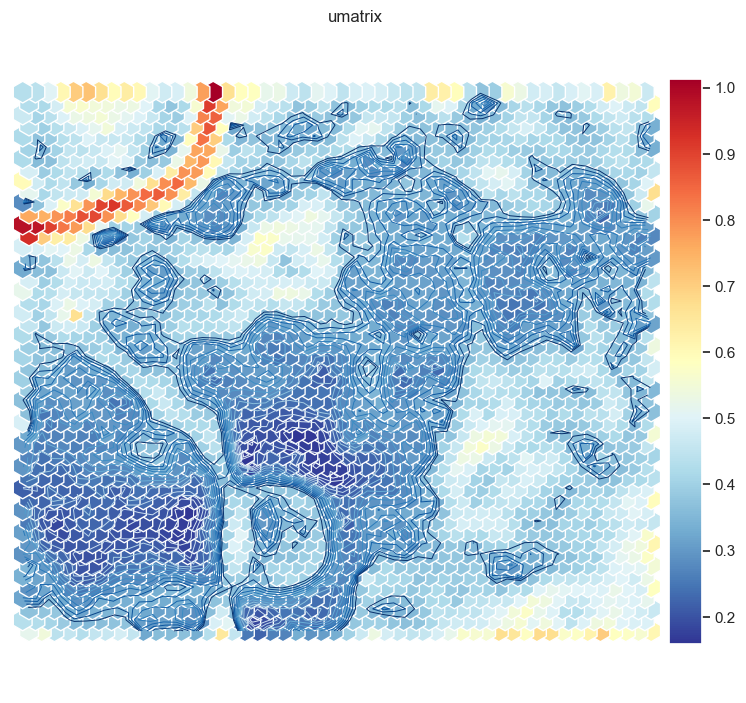

R2 score:  0.3397411471275682
Silhouette score:  0.06058515291559951
Calinski and Harabasz score:  591.4838504991524
Davies-Bouldin score:  4.08222838454092
Label Count :  Counter({2: 904, 0: 715, 1: 683})


In [156]:
nodes = sm.codebook.matrix

# U-matrix of the 50x50 grid
u = sompy.umatrix.UMatrixView(9, 9, 'umatrix', show_axis=True, text_size=8, show_text=True)

UMAT = u.show(
    sm, 
    distance=2, 
    row_normalized=False, 
    show_data=False, 
    contour=True # Visualize isomorphic curves
)

df_nodes = pd.DataFrame(nodes, columns=feats_corr)
df_nodes['label'] = nodeclus_labels_km3 # we'll use the kmeans for 3 clusters 

bmus_map = sm.find_bmu(df_robust)[0]  # get bmus for each observation in df

df_bmus = pd.DataFrame(
    np.concatenate((df_robust, np.expand_dims(bmus_map,1)), axis=1),
    index=df_robust.index, columns=np.append(df_robust.columns,"BMU")
)

df_som = df_bmus.merge(df_nodes['label'], 'left', left_on="BMU", right_index=True)

scores(df_som['label'])

<div class="alert alert-block alert-success">

### Final decision:

</div>
We'll keep the kmeans clustering, with 3 clusters.

In [157]:
df3_concat_km.to_csv('kids_preprocessing.csv')